In [ ]:
import os
import numpy as np
import pandas as pd
import random
import torch
import torch.serialization
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
import pickle
import copy
import gpytorch
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.mlls import ExactMarginalLogLikelihood
#from gp_pytorch_accelerated import GPModel
import warnings

warnings.filterwarnings('ignore')

: 

In [ ]:
import copy
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

: 

In [ ]:
os.chdir(r"C:\Users\dweis\OneDrive\Documents\Career\Research Paper")

: 

In [ ]:
def seed_everything(seed=42):

    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


seed_everything(42) # - Run 1
#seed_everything(63) # - Run 2
#seed_everything(84) # - Run 3

: 

In [ ]:
from src.data_loading import load_wind_data, extract_timeseries, split_timeperiods, normalise_timeseries, normalise_full_timeseries
from src.vae_models import extract_vae_features, TimeSeriesVAE
from src.clustering import assign_test_clusters
from src.gp import create_cluster_forecasting_datasets, GPModel
from src.plotting import plot_cluster_predictions

: 

In [ ]:
# Load target wind farm data
target_csv_path = r'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Data\Data_Per_Wind_Farm\East_Anglia_One.csv'
target_df = load_wind_data(target_csv_path)

# Load source farm pre-trained models
with open(r'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Models\VAEs\Final_VAE\all_combinations_2.0.pkl', 'rb') as f:
    all_combinations = pickle.load(f)

best_key = max(all_combinations, key=lambda k: all_combinations[k]['combined_score'])
optimal_config = all_combinations[best_key]
source_results = {'optimal_config': optimal_config}

: 

In [ ]:
def transfer_learning_gp_1(target_df, source_results, data_fraction=0.1,
                         gp_dir="results", plot_predictions_flag=False, random_state=42):

    print("GP TRANSFER LEARNING FOR WIND POWER FORECASTING")
    print("=" * 80)

    # Extract source configuration
    optimal_config = source_results['optimal_config']
    n_clusters = optimal_config['k_clusters']
    time_period_hours = optimal_config['time_period_hours']
    source_vae = optimal_config['vae']
    source_train_latent = optimal_config['train_latent']
    source_train_labels = optimal_config['train_cluster_labels']
    source_vae.eval()

    print(f"Configuration: {time_period_hours}h periods, {n_clusters} clusters")
    print(f"Target data: {data_fraction*100:.1f}% for training, {(1-data_fraction)*100:.1f}% for testing")

    # Step 1: Extract timeseries from target data
    print("\nStep 1: Extracting timeseries...")
    timeseries_matrix_full_t, timeseries_matrix_vae_t, period_info_t = extract_timeseries(target_df, time_period_hours)
    print(f"  Extracted {len(timeseries_matrix_full_t)} time periods")

    # Step 2: Split into train/test
    print("\nStep 2: Splitting data...")
    test_ratio = 1.0 - data_fraction
    split_data_vae = split_timeperiods(timeseries_matrix_vae_t, period_info_t, test_ratio=test_ratio, random_state=random_state)
    train_indices = split_data_vae['train_indices']
    test_indices = split_data_vae['test_indices']

    train_period_info = split_data_vae['train_period_info']
    test_period_info = split_data_vae['test_period_info']

    train_timeseries_full_t = timeseries_matrix_full_t[train_indices]
    test_timeseries_full_t = timeseries_matrix_full_t[test_indices]
    train_timeseries_vae_t = split_data_vae['train_timeseries']
    test_timeseries_vae_t = split_data_vae['test_timeseries']

    print(f"  Train: {len(train_timeseries_vae_t)} periods, Test: {len(test_timeseries_vae_t)} periods")

    # Step 3: Normalise data
    print("\nStep 3: Normalising data...")
    train_normalised_vae_t, test_normalised_vae_t, _ = normalise_timeseries(train_timeseries_vae_t, test_timeseries_vae_t)
    train_normalised_full_t, test_normalised_full_t, target_scalers_full, _ = normalise_full_timeseries(train_timeseries_full_t, test_timeseries_full_t)

    # Step 4: Extract VAE features using source VAE
    print("\nStep 4: Extracting VAE features...")
    train_latent_matrix_t = extract_vae_features(source_vae, train_normalised_vae_t, device='cpu')
    test_latent_matrix_t = extract_vae_features(source_vae, test_normalised_vae_t, device='cpu')
    print(f"  Latent dimensions: {train_latent_matrix_t.shape[1]}")

    # Step 5: Assign target periods to source clusters
    print("\nStep 5: Assigning to source clusters...")
    train_cluster_labels_t = assign_test_clusters(source_train_latent, train_latent_matrix_t, source_train_labels)
    test_cluster_labels_t = assign_test_clusters(source_train_latent, test_latent_matrix_t, source_train_labels)

    train_clusters = sorted(np.unique(train_cluster_labels_t))
    test_clusters = sorted(np.unique(test_cluster_labels_t))
    all_source_clusters = sorted(np.unique(source_train_labels))

    print(f"  Train clusters present: {train_clusters}")
    print(f"  Test clusters present: {test_clusters}")

    # Step 6: Create forecasting datasets
    print("\nStep 6: Creating forecasting datasets...")
    train_cluster_dataset = create_cluster_forecasting_datasets(
        train_latent_matrix_t, train_normalised_full_t, train_cluster_labels_t, period_indices=np.arange(len(train_latent_matrix_t)), period_info=train_period_info, forecast_horizon=1)
    test_cluster_dataset = create_cluster_forecasting_datasets(
        test_latent_matrix_t, test_normalised_full_t, test_cluster_labels_t, period_indices=np.arange(len(test_latent_matrix_t)), period_info=test_period_info, forecast_horizon=1)

    # Step 7: Load and fine-tune GP models
    print("\nStep 7: Fine-tuning GP models...")
    cluster_models = {}
    device = 'cpu'

    for cluster_id in all_source_clusters:
        print(f"\nCluster {cluster_id}...")

        if cluster_id not in train_cluster_dataset or cluster_id not in test_cluster_dataset:
            print(f"  Skipped: No data")
            continue

        # Load pre-trained GP model
        gp_path = os.path.join(gp_dir, f"gp_cluster_{cluster_id}_{time_period_hours}h_{n_clusters}k.pkl")
        if not os.path.exists(gp_path):
            print(f"  Skipped: No pre-trained model found")
            continue

        try:
            # Force CPU loading to avoid GPU OOM
            _original_restore_location = torch.serialization.default_restore_location
            torch.serialization.default_restore_location = lambda storage, location: _original_restore_location(storage, 'cpu')

            try:
                with open(gp_path, 'rb') as f:
                    checkpoint = pickle.load(f)
            finally:
                torch.serialization.default_restore_location = _original_restore_location

            if torch.cuda.is_available():
                torch.cuda.empty_cache()

            # Extract model and likelihood
            if isinstance(checkpoint, dict):
                source_model = checkpoint.get('gp_model', checkpoint.get('gp'))
                source_likelihood = checkpoint.get('likelihood')
            else:
                source_model = checkpoint
                source_likelihood = None

            source_model = source_model.cpu()
            if source_likelihood is not None:
                source_likelihood = source_likelihood.cpu()

            # Get target data
            train_data = train_cluster_dataset[cluster_id]
            test_data = test_cluster_dataset[cluster_id]
            X_train, y_train = train_data['X'], train_data['y']
            X_test, y_test = test_data['X'], test_data['y']

            if len(X_train) < 10 or len(X_test) < 10:
                print(f"  Skipped: Insufficient samples")
                continue

            # Convert to tensors
            train_x = torch.FloatTensor(X_train).to(device)
            train_y = torch.FloatTensor(y_train).to(device)
            test_x = torch.FloatTensor(X_test).to(device)

            # Fine-tune GP model
            target_likelihood = GaussianLikelihood(noise_constraint=None).to(device)

            # Transfer and freeze noise parameter
            if source_likelihood is not None:
                target_likelihood.noise = source_likelihood.noise.clone()

          #  target_likelihood.noise_covar.raw_noise.requires_grad = False

            # Create target model and transfer hyperparameters
            target_model = GPModel(train_x, train_y, target_likelihood).to(device)
            target_model.load_state_dict(source_model.state_dict())

            # Fine-tune kernel hyperparameters only
            target_model.train()
            target_likelihood.train()

            optimizer = torch.optim.Adam(target_model.parameters(), lr=0.05)
            mll = ExactMarginalLogLikelihood(target_likelihood, target_model)

            for i in range(50):
                optimizer.zero_grad()
                output = target_model(train_x)
                loss = -mll(output, train_y)

                if torch.isnan(loss) or torch.isinf(loss):
                    print(f"  Warning: Invalid loss at iteration {i}, stopping")
                    break

                loss.backward()
                optimizer.step()

            # Evaluate on test set
            target_model.eval()
            target_likelihood.eval()

            with torch.no_grad(), gpytorch.settings.fast_pred_var():
                predictions = target_likelihood(target_model(test_x))
                y_pred = predictions.mean.cpu().numpy()
                y_std = predictions.stddev.cpu().numpy()

            # Scale predictions and uncertainties to MW
            if 'Power' in target_scalers_full:
                power_scaler = target_scalers_full['Power']
                power_range = power_scaler.data_max_[0] - power_scaler.data_min_[0]

                y_test_mw = power_scaler.inverse_transform(y_test.reshape(-1, 1)).ravel()
                y_pred_mw = np.clip(power_scaler.inverse_transform(y_pred.reshape(-1, 1)).ravel(), 0, 714)
                y_std_mw = y_std * power_range

                mae = mean_absolute_error(y_test_mw, y_pred_mw)
                r2 = r2_score(y_test_mw, y_pred_mw)
                rmse = np.sqrt(mean_squared_error(y_test_mw, y_pred_mw))

                print(f"  MAE: {mae:.1f} MW, R²: {r2:.3f}, RMSE: {rmse:.1f} MW")

                cluster_models[cluster_id] = {
                    'gp': target_model,
                    'likelihood': target_likelihood,
                    'metrics': {'mae': mae, 'r2': r2, 'rmse': rmse, 'n_train': len(y_train), 'n_test': len(y_test)},
                    'predictions_mw': y_pred_mw,
                    'actuals_mw': y_test_mw,
                    'uncertainties_mw': y_std_mw,
                    'predictions_norm': y_pred,
                    'actuals_norm': y_test,
                    'uncertainties_norm': y_std
                }
            else:
                mae = mean_absolute_error(y_test, y_pred)
                r2 = r2_score(y_test, y_pred)
                rmse = np.sqrt(mean_squared_error(y_test, y_pred))

                cluster_models[cluster_id] = {
                    'gp': target_model,
                    'likelihood': target_likelihood,
                    'metrics': {'mae': mae, 'r2': r2, 'rmse': rmse, 'n_train': len(y_train), 'n_test': len(y_test)},
                    'predictions_norm': y_pred,
                    'actuals_norm': y_test,
                    'uncertainties_norm': y_std
                }

        except Exception as e:
            print(f"  Error: {e}")
            continue

    if not cluster_models:
        raise RuntimeError("No GP models were successfully processed")

    # Step 8: Calculate overall metrics
    print("\n" + "="*80)
    print("RESULTS SUMMARY")
    print("="*80)

    all_maes = np.array([m['metrics']['mae'] for m in cluster_models.values()])
    all_r2s = np.array([m['metrics']['r2'] for m in cluster_models.values()])
    all_rmses = np.array([m['metrics']['rmse'] for m in cluster_models.values()])

    overall_metrics = {
        'mae_mean': np.mean(all_maes),
        'mae_std': np.std(all_maes),
        'r2_mean': np.mean(all_r2s),
        'r2_std': np.std(all_r2s),
        'rmse_mean': np.mean(all_rmses),
        'rmse_std': np.std(all_rmses),
        'clusters_processed': len(cluster_models),
        'total_clusters': len(all_source_clusters),
        'data_fraction': data_fraction
    }

    print(f"Data used: {data_fraction*100:.1f}% of target data")
    print(f"Clusters: {overall_metrics['clusters_processed']}/{overall_metrics['total_clusters']} processed")
    print(f"MAE:  {overall_metrics['mae_mean']:.2f} ± {overall_metrics['mae_std']:.2f} MW")
    print(f"R²:   {overall_metrics['r2_mean']:.3f} ± {overall_metrics['r2_std']:.3f}")
    print(f"RMSE: {overall_metrics['rmse_mean']:.2f} ± {overall_metrics['rmse_std']:.2f} MW")

    # Generate plots if requested
    if plot_predictions_flag:
        print("\nGenerating prediction plots...")

        plotting_config = {
            'time_period_hours': time_period_hours,
            'k_clusters': n_clusters,
            'scalers': target_scalers_full,
        }

        final_results = {'cluster_gp_models': {}}
        for cluster_id, model_info in cluster_models.items():
            model_metrics = model_info['metrics'].copy()
            if 'predictions_mw' in model_info:
                model_metrics.update({
                    'actual_original': model_info['actuals_mw'],
                    'predictions_original': model_info['predictions_mw'],
                    'uncertainties_original': model_info['uncertainties_mw']
                })
            else:
                model_metrics.update({
                    'actual_normalized': model_info['actuals_norm'],
                    'predictions_normalized': model_info['predictions_norm'],
                    'uncertainties_normalized': model_info['uncertainties_norm']
                })
            final_results['cluster_gp_models'][cluster_id] = {'metrics': model_metrics}

        plot_cluster_predictions(final_results, plotting_config, plot_hours=72)

    return {
        'cluster_models': cluster_models,
        'overall_metrics': overall_metrics,
        'data_fraction': data_fraction,
        'n_clusters_processed': len(cluster_models)
    }

: 

In [12]:
def transfer_learning_gp(target_df, source_results, data_fraction=0.1,
                                    gp_dir="results", vae_epochs=50, vae_lr=1e-4,
                                    gp_iterations=50, gp_lr=0.05,
                                    plot_predictions_flag=False, random_state=42):
    
    print("="*80)
    print("VAE FINE-TUNED TRANSFER LEARNING FOR WIND POWER FORECASTING")
    print("="*80)
    
    # Extract source configuration
    optimal_config = source_results['optimal_config']
    n_clusters = optimal_config['k_clusters']
    time_period_hours = optimal_config['time_period_hours']
    source_vae = optimal_config['vae']
    source_train_latent = optimal_config['train_latent']
    source_train_labels = optimal_config['train_cluster_labels']
    
    print(f"Configuration: {time_period_hours}h periods, {n_clusters} clusters")
    print(f"VAE fine-tuning: {vae_epochs} epochs @ lr={vae_lr}")
    print(f"GP fine-tuning: {gp_iterations} iterations @ lr={gp_lr}")
    print(f"Target data: {data_fraction*100:.1f}% for training, {(1-data_fraction)*100:.1f}% for testing\n")
    
    # =========================================================================
    # STEP 1: Extract timeseries from target data
    # =========================================================================
    print("Step 1: Extracting timeseries...")
    timeseries_matrix_full_t, timeseries_matrix_vae_t, period_info_t = extract_timeseries(
        target_df, time_period_hours
    )
    print(f"  Extracted {len(timeseries_matrix_full_t)} time periods")
    
    # =========================================================================
    # STEP 2: Split into train/test
    # =========================================================================
    print("\nStep 2: Splitting data...")
    test_ratio = 1.0 - data_fraction
    split_data_vae = split_timeperiods(
        timeseries_matrix_vae_t, period_info_t, 
        test_ratio=test_ratio, random_state=random_state
    )
    
    train_indices = split_data_vae['train_indices']
    test_indices = split_data_vae['test_indices']
    train_period_info = split_data_vae['train_period_info']
    test_period_info = split_data_vae['test_period_info']
    
    train_timeseries_vae_t = split_data_vae['train_timeseries']
    test_timeseries_vae_t = split_data_vae['test_timeseries']
    train_timeseries_full_t = timeseries_matrix_full_t[train_indices]
    test_timeseries_full_t = timeseries_matrix_full_t[test_indices]
    
    print(f"  Train: {len(train_timeseries_vae_t)} periods, Test: {len(test_timeseries_vae_t)} periods")
    
    # =========================================================================
    # STEP 3: Normalize data
    # =========================================================================
    print("\nStep 3: Normalizing data...")
    train_normalised_vae_t, test_normalised_vae_t, _ = normalise_timeseries(
        train_timeseries_vae_t, test_timeseries_vae_t
    )
    train_normalised_full_t, test_normalised_full_t, target_scalers_full, _ = normalise_full_timeseries(
        train_timeseries_full_t, test_timeseries_full_t
    )
    print(f"  Normalized {train_normalised_vae_t.shape[0]} train samples")
    
    # =========================================================================
    # STEP 4: Extract features with SOURCE VAE and assign to SOURCE clusters
    # =========================================================================
    print("\nStep 4: Extracting features with SOURCE VAE for clustering...")
    source_vae.eval()
    device = 'cpu'  # Use CPU to avoid memory issues
    source_vae = source_vae.to(device)
    
    train_latent_source = extract_vae_features(source_vae, train_normalised_vae_t, device=device)
    test_latent_source = extract_vae_features(source_vae, test_normalised_vae_t, device=device)
    print(f"  Latent dimensions: {train_latent_source.shape[1]}")
    
    print("\nStep 5: Assigning to SOURCE clusters (universal weather regimes)...")
    train_cluster_labels_t = assign_test_clusters(
        source_train_latent, train_latent_source, source_train_labels
    )
    test_cluster_labels_t = assign_test_clusters(
        source_train_latent, test_latent_source, source_train_labels
    )
    
    train_clusters = sorted(np.unique(train_cluster_labels_t))
    test_clusters = sorted(np.unique(test_cluster_labels_t))
    all_source_clusters = sorted(np.unique(source_train_labels))
    
    print(f"  Train clusters present: {train_clusters}")
    print(f"  Test clusters present: {test_clusters}")
    
    # Calculate initial distribution shift
    source_mean = np.mean(source_train_latent, axis=0)
    source_std = np.std(source_train_latent, axis=0)
    target_mean_source_space = np.mean(train_latent_source, axis=0)
    target_std_source_space = np.std(train_latent_source, axis=0)
    initial_shift = np.mean(np.abs(source_mean - target_mean_source_space))
    print(f"  Initial distribution shift: {initial_shift:.4f}")
    
    # =========================================================================
    # STEP 6: Fine-tune VAE on target data
    # =========================================================================
    print("\nStep 6: Fine-tuning VAE on target data...")
    target_vae = copy.deepcopy(source_vae)
    target_vae.train()
    target_vae = target_vae.to(device)
    
    optimizer = torch.optim.Adam(target_vae.parameters(), lr=vae_lr)
    train_tensor = torch.FloatTensor(train_normalised_vae_t).to(device)
    
    initial_loss = None
    for epoch in range(vae_epochs):
        optimizer.zero_grad()
        
        # Forward pass through VAE
        try:
            mu, logvar = target_vae.encode(train_tensor)
            std = torch.exp(0.5 * logvar)
            eps = torch.randn_like(std)
            z = mu + eps * std
            recon = target_vae.decode(z)
        except:
            # Fallback for different VAE architectures
            vae_output = target_vae(train_tensor)
            if isinstance(vae_output, tuple):
                if len(vae_output) == 3:
                    recon, mu, logvar = vae_output
                elif len(vae_output) == 4:
                    recon, mu, logvar, z = vae_output
                elif len(vae_output) == 2:
                    if isinstance(vae_output[1], tuple) and len(vae_output[1]) == 2:
                        recon, (mu, logvar) = vae_output
            else:
                raise ValueError("Unexpected VAE output format")
        
        # Compute loss
        recon_loss = F.mse_loss(recon, train_tensor, reduction='mean')
        kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / train_tensor.size(0)
        loss = recon_loss + 0.1 * kl_loss
        
        if epoch == 0:
            initial_loss = loss.item()
        
        loss.backward()
        optimizer.step()
        
        if epoch % 10 == 0:
            print(f"  Epoch {epoch}/{vae_epochs}: Loss={loss.item():.4f} (Recon={recon_loss.item():.4f}, KL={kl_loss.item():.4f})")
    
    target_vae.eval()
    final_loss = loss.item()
    vae_improvement = initial_loss - final_loss
    print(f"  ✓ VAE fine-tuned. Loss improvement: {vae_improvement:.4f}")
    
    # =========================================================================
    # STEP 7: Extract features with FINE-TUNED VAE
    # =========================================================================
    print("\nStep 7: Extracting features with fine-tuned VAE...")
    train_latent_matrix_t = extract_vae_features(target_vae, train_normalised_vae_t, device=device)
    test_latent_matrix_t = extract_vae_features(target_vae, test_normalised_vae_t, device=device)
    print(f"  Train latent shape: {train_latent_matrix_t.shape}")
    print(f"  Test latent shape: {test_latent_matrix_t.shape}")
    
    # Calculate final distribution shift
    target_mean_final = np.mean(train_latent_matrix_t, axis=0)
    target_std_final = np.std(train_latent_matrix_t, axis=0)
    final_mean_shift = np.mean(np.abs(source_mean - target_mean_final))
    final_std_shift = np.mean(np.abs(source_std - target_std_final))
    print(f"  Final distribution shift - Mean: {final_mean_shift:.4f}, Std: {final_std_shift:.4f}")
    
    # =========================================================================
    # STEP 8: Create forecasting datasets with fine-tuned features
    #         USING THE ORIGINAL SOURCE CLUSTER ASSIGNMENTS
    # =========================================================================
    print("\nStep 8: Creating forecasting datasets...")
    print(f"  Using SOURCE cluster assignments with FINE-TUNED features")
    
    train_cluster_dataset = create_cluster_forecasting_datasets(
        train_latent_matrix_t,  # Fine-tuned features
        train_normalised_full_t, 
        train_cluster_labels_t,  # Source cluster assignments
        period_indices=np.arange(len(train_latent_matrix_t)),
        period_info=train_period_info,
        forecast_horizon=1
    )
    
    test_cluster_dataset = create_cluster_forecasting_datasets(
        test_latent_matrix_t,  # Fine-tuned features
        test_normalised_full_t, 
        test_cluster_labels_t,  # Source cluster assignments
        period_indices=np.arange(len(test_latent_matrix_t)),
        period_info=test_period_info,
        forecast_horizon=1
    )
    
    print(f"  Created datasets for {len(train_cluster_dataset)} clusters")
    
    # =========================================================================
    # STEP 9: Load and fine-tune GP models with transfer learning
    # =========================================================================
    print("\nStep 9: Fine-tuning GP models with hyperparameter transfer...")
    cluster_models = {}
    
    for cluster_id in all_source_clusters:
        print(f"\nCluster {cluster_id}...")
        
        if cluster_id not in train_cluster_dataset or cluster_id not in test_cluster_dataset:
            print(f"  Skipped: No data")
            continue
        
        # Load pre-trained GP model
        gp_path = os.path.join(gp_dir, f"gp_cluster_{cluster_id}_{time_period_hours}h_{n_clusters}k.pkl")
        if not os.path.exists(gp_path):
            print(f"  Skipped: No pre-trained model found")
            continue
        
        try:
            # Force CPU loading
            _original_restore_location = torch.serialization.default_restore_location
            torch.serialization.default_restore_location = lambda storage, location: _original_restore_location(storage, 'cpu')
            
            try:
                with open(gp_path, 'rb') as f:
                    checkpoint = pickle.load(f)
            finally:
                torch.serialization.default_restore_location = _original_restore_location
            
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
            
            # Extract source model and likelihood
            if isinstance(checkpoint, dict):
                source_model = checkpoint.get('gp_model', checkpoint.get('gp'))
                source_likelihood = checkpoint.get('likelihood')
            else:
                source_model = checkpoint
                source_likelihood = None
            
            source_model = source_model.cpu()
            if source_likelihood is not None:
                source_likelihood = source_likelihood.cpu()
            
            # Get target data
            train_data = train_cluster_dataset[cluster_id]
            test_data = test_cluster_dataset[cluster_id]
            X_train, y_train = train_data['X'], train_data['y']
            X_test, y_test = test_data['X'], test_data['y']
            
            if len(X_train) < 10 or len(X_test) < 10:
                print(f"  Skipped: Insufficient samples")
                continue
            
            # Convert to tensors
            train_x = torch.FloatTensor(X_train).to(device)
            train_y = torch.FloatTensor(y_train).to(device)
            test_x = torch.FloatTensor(X_test).to(device)
            
            # Create target model and transfer hyperparameters
            target_likelihood = GaussianLikelihood(noise_constraint=None).to(device)
            
            # Transfer noise parameter
            if source_likelihood is not None:
                target_likelihood.noise = source_likelihood.noise.clone()
            
            # Create target model
            target_model = GPModel(train_x, train_y, target_likelihood).to(device)
            
            # Transfer all hyperparameters from source
            target_model.load_state_dict(source_model.state_dict())
            
            # Fine-tune with CONSERVATIVE settings
            target_model.train()
            target_likelihood.train()
            
            optimizer = torch.optim.Adam(target_model.parameters(), lr=gp_lr)
            mll = ExactMarginalLogLikelihood(target_likelihood, target_model)
            
            for i in range(gp_iterations):
                optimizer.zero_grad()
                output = target_model(train_x)
                loss = -mll(output, train_y)
                
                if torch.isnan(loss) or torch.isinf(loss):
                    print(f"  Warning: Invalid loss at iteration {i}, stopping")
                    break
                
                loss.backward()
                optimizer.step()
            
            # Evaluate on test set
            target_model.eval()
            target_likelihood.eval()
            
            with torch.no_grad(), gpytorch.settings.fast_pred_var():
                predictions = target_likelihood(target_model(test_x))
                y_pred = predictions.mean.cpu().numpy()
                y_std = predictions.stddev.cpu().numpy()
            
            # Scale predictions to MW
            if 'Power' in target_scalers_full:
                power_scaler = target_scalers_full['Power']
                power_range = power_scaler.data_max_[0] - power_scaler.data_min_[0]
                
                y_test_mw = power_scaler.inverse_transform(y_test.reshape(-1, 1)).ravel()
                y_pred_mw = power_scaler.inverse_transform(y_pred.reshape(-1, 1)).ravel()
                # Clip to physically realistic values (0 to farm capacity)
                max_capacity = power_scaler.data_max_[0]
                y_pred_mw = np.clip(y_pred_mw, 0, max_capacity)
                y_std_mw = y_std * power_range
                
                mae = mean_absolute_error(y_test_mw, y_pred_mw)
                r2 = r2_score(y_test_mw, y_pred_mw)
                rmse = np.sqrt(mean_squared_error(y_test_mw, y_pred_mw))
                
                print(f"  MAE: {mae:.1f} MW, R²: {r2:.3f}, RMSE: {rmse:.1f} MW")
                
                cluster_models[cluster_id] = {
                    'gp': target_model,
                    'likelihood': target_likelihood,
                    'metrics': {
                        'mae': mae, 'r2': r2, 'rmse': rmse, 
                        'n_train': len(y_train), 'n_test': len(y_test)
                    },
                    'predictions_mw': y_pred_mw,
                    'actuals_mw': y_test_mw,
                    'uncertainties_mw': y_std_mw,
                    'predictions_norm': y_pred,
                    'actuals_norm': y_test,
                    'uncertainties_norm': y_std
                }
            else:
                mae = mean_absolute_error(y_test, y_pred)
                r2 = r2_score(y_test, y_pred)
                rmse = np.sqrt(mean_squared_error(y_test, y_pred))
                
                cluster_models[cluster_id] = {
                    'gp': target_model,
                    'likelihood': target_likelihood,
                    'metrics': {
                        'mae': mae, 'r2': r2, 'rmse': rmse,
                        'n_train': len(y_train), 'n_test': len(y_test)
                    },
                    'predictions_norm': y_pred,
                    'actuals_norm': y_test,
                    'uncertainties_norm': y_std
                }
        
        except Exception as e:
            print(f"  Error: {e}")
            continue
    
    if not cluster_models:
        raise RuntimeError("No GP models were successfully processed")
    
    # =========================================================================
    # STEP 10: Calculate overall metrics
    # =========================================================================
    print("\n" + "="*80)
    print("RESULTS SUMMARY")
    print("="*80)
    
    all_maes = np.array([m['metrics']['mae'] for m in cluster_models.values()])
    all_r2s = np.array([m['metrics']['r2'] for m in cluster_models.values()])
    all_rmses = np.array([m['metrics']['rmse'] for m in cluster_models.values()])
    
    overall_metrics = {
        'mae_mean': np.mean(all_maes),
        'mae_std': np.std(all_maes),
        'r2_mean': np.mean(all_r2s),
        'r2_std': np.std(all_r2s),
        'rmse_mean': np.mean(all_rmses),
        'rmse_std': np.std(all_rmses),
        'clusters_processed': len(cluster_models),
        'total_clusters': len(all_source_clusters),
        'data_fraction': data_fraction,
        'vae_epochs': vae_epochs,
        'vae_improvement': vae_improvement,
        'gp_iterations': gp_iterations,
        'gp_lr': gp_lr,
        'distribution_shift': {
            'initial_shift': initial_shift,
            'final_mean_shift': final_mean_shift,
            'final_std_shift': final_std_shift
        }
    }
    
    print(f"Methodology: VAE fine-tuned ({vae_epochs} epochs), GP transferred ({gp_iterations} iter @ lr={gp_lr})")
    print(f"Data used: {data_fraction*100:.1f}% of target data")
    print(f"VAE adaptation: Loss improvement = {vae_improvement:.4f}")
    print(f"Distribution shift: Initial={initial_shift:.4f} → Final Mean={final_mean_shift:.4f}, Std={final_std_shift:.4f}")
    print(f"Clusters: {overall_metrics['clusters_processed']}/{overall_metrics['total_clusters']} processed")
    print(f"MAE:  {overall_metrics['mae_mean']:.2f} ± {overall_metrics['mae_std']:.2f} MW")
    print(f"R²:   {overall_metrics['r2_mean']:.3f} ± {overall_metrics['r2_std']:.3f}")
    print(f"RMSE: {overall_metrics['rmse_mean']:.2f} ± {overall_metrics['rmse_std']:.2f} MW")
    
    # Generate plots if requested
    if plot_predictions_flag:
        print("\nGenerating prediction plots...")
        
        plotting_config = {
            'time_period_hours': time_period_hours,
            'k_clusters': n_clusters,
            'scalers': target_scalers_full,
        }
        
        final_results = {'cluster_gp_models': {}}
        for cluster_id, model_info in cluster_models.items():
            model_metrics = model_info['metrics'].copy()
            if 'predictions_mw' in model_info:
                model_metrics.update({
                    'actual_original': model_info['actuals_mw'],
                    'predictions_original': model_info['predictions_mw'],
                    'uncertainties_original': model_info['uncertainties_mw']
                })
            else:
                model_metrics.update({
                    'actual_normalized': model_info['actuals_norm'],
                    'predictions_normalized': model_info['predictions_norm'],
                    'uncertainties_normalized': model_info['uncertainties_norm']
                })
            final_results['cluster_gp_models'][cluster_id] = {'metrics': model_metrics}
        
        try:
            plot_cluster_predictions(final_results, plotting_config, plot_hours=72)
        except Exception as e:
            print(f"  Warning: Plot generation failed - {e}")
    
    return {
        'cluster_models': cluster_models,
        'overall_metrics': overall_metrics,
        'data_fraction': data_fraction,
        'n_clusters_processed': len(cluster_models),
        'fine_tuned_vae': target_vae,
        'vae_improvement': vae_improvement,
        'train_cluster_labels': train_cluster_labels_t,
        'test_cluster_labels': test_cluster_labels_t
    }


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 1 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 291 train periods and 2626 test periods
  Train: 291 periods, Test: 2626 periods

Step 3: Normalising data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL training data statistics...
  Applying log transform to fsr
  Skipping normalisation for hour_sin (cyclical feature)
  Skipping normalis

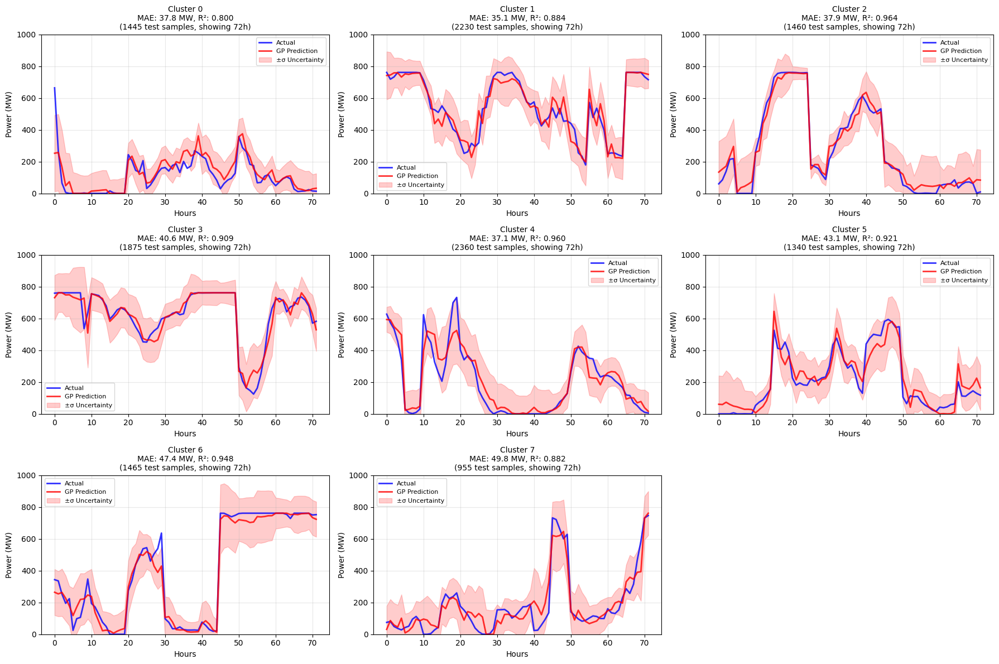


Prediction Plot Summary:
Cluster 0: MAE=37.8 MW, R²=0.800 (1445 test points)
Cluster 1: MAE=35.1 MW, R²=0.884 (2230 test points)
Cluster 2: MAE=37.9 MW, R²=0.964 (1460 test points)
Cluster 3: MAE=40.6 MW, R²=0.909 (1875 test points)
Cluster 4: MAE=37.1 MW, R²=0.960 (2360 test points)
Cluster 5: MAE=43.1 MW, R²=0.921 (1340 test points)
Cluster 6: MAE=47.4 MW, R²=0.948 (1465 test points)
Cluster 7: MAE=49.8 MW, R²=0.882 (955 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 20.0% for training, 80.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 1 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 583 train periods and 2334 test periods
  Train: 583 periods, Test: 2334 periods

Step 3: Normalising data

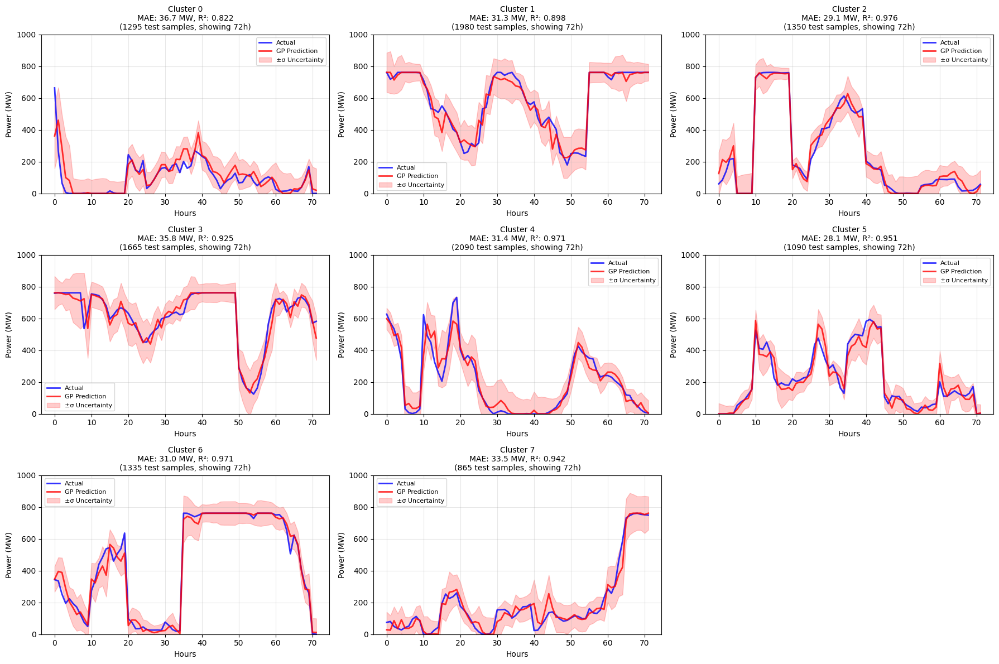


Prediction Plot Summary:
Cluster 0: MAE=36.7 MW, R²=0.822 (1295 test points)
Cluster 1: MAE=31.3 MW, R²=0.898 (1980 test points)
Cluster 2: MAE=29.1 MW, R²=0.976 (1350 test points)
Cluster 3: MAE=35.8 MW, R²=0.925 (1665 test points)
Cluster 4: MAE=31.4 MW, R²=0.971 (2090 test points)
Cluster 5: MAE=28.1 MW, R²=0.951 (1090 test points)
Cluster 6: MAE=31.0 MW, R²=0.971 (1335 test points)
Cluster 7: MAE=33.5 MW, R²=0.942 (865 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 30.0% for training, 70.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 1 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 875 train periods and 2042 test periods
  Train: 875 periods, Test: 2042 periods

Step 3: Normalising data

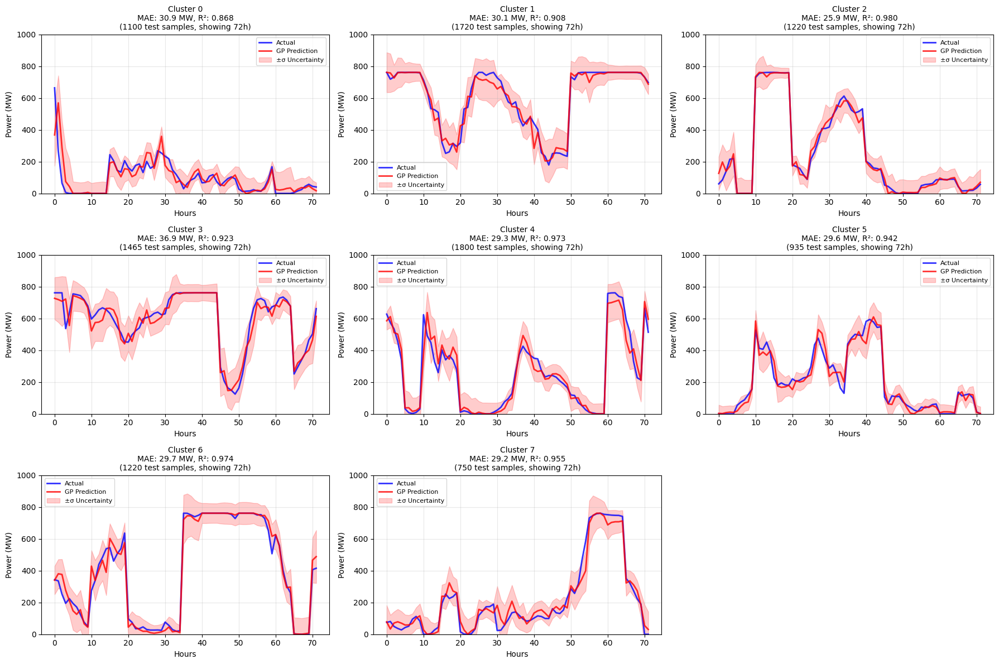


Prediction Plot Summary:
Cluster 0: MAE=30.9 MW, R²=0.868 (1100 test points)
Cluster 1: MAE=30.1 MW, R²=0.908 (1720 test points)
Cluster 2: MAE=25.9 MW, R²=0.980 (1220 test points)
Cluster 3: MAE=36.9 MW, R²=0.923 (1465 test points)
Cluster 4: MAE=29.3 MW, R²=0.973 (1800 test points)
Cluster 5: MAE=29.6 MW, R²=0.942 (935 test points)
Cluster 6: MAE=29.7 MW, R²=0.974 (1220 test points)
Cluster 7: MAE=29.2 MW, R²=0.955 (750 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 40.0% for training, 60.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 1 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 1166 train periods and 1751 test periods
  Train: 1166 periods, Test: 1751 periods

Step 3: Normalising dat

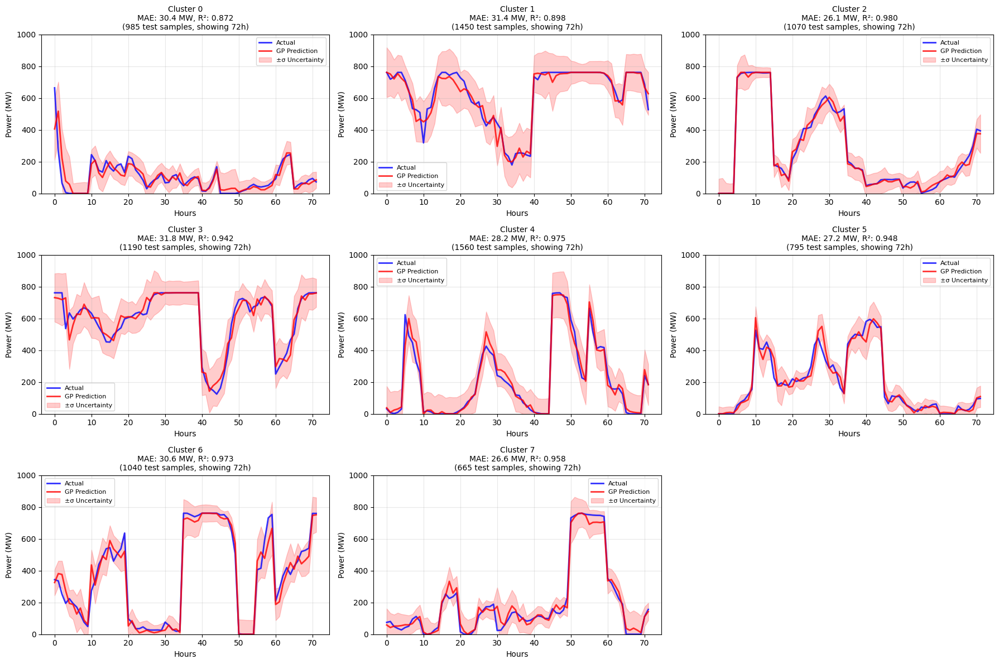


Prediction Plot Summary:
Cluster 0: MAE=30.4 MW, R²=0.872 (985 test points)
Cluster 1: MAE=31.4 MW, R²=0.898 (1450 test points)
Cluster 2: MAE=26.1 MW, R²=0.980 (1070 test points)
Cluster 3: MAE=31.8 MW, R²=0.942 (1190 test points)
Cluster 4: MAE=28.2 MW, R²=0.975 (1560 test points)
Cluster 5: MAE=27.2 MW, R²=0.948 (795 test points)
Cluster 6: MAE=30.6 MW, R²=0.973 (1040 test points)
Cluster 7: MAE=26.6 MW, R²=0.958 (665 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 50.0% for training, 50.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 1 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 1458 train periods and 1459 test periods
  Train: 1458 periods, Test: 1459 periods

Step 3: Normalising data

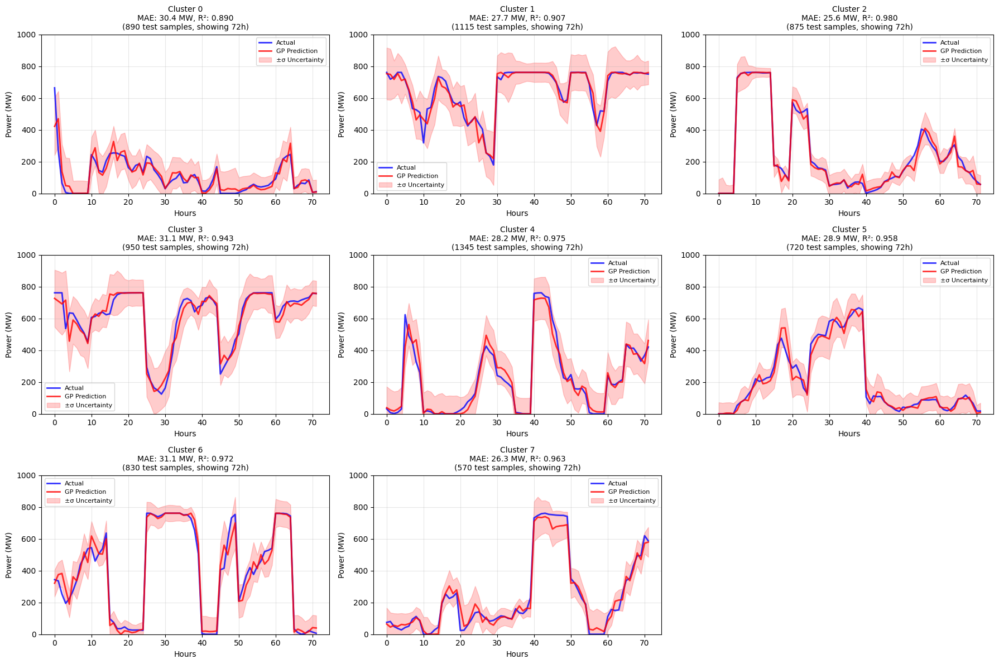


Prediction Plot Summary:
Cluster 0: MAE=30.4 MW, R²=0.890 (890 test points)
Cluster 1: MAE=27.7 MW, R²=0.907 (1115 test points)
Cluster 2: MAE=25.6 MW, R²=0.980 (875 test points)
Cluster 3: MAE=31.1 MW, R²=0.943 (950 test points)
Cluster 4: MAE=28.2 MW, R²=0.975 (1345 test points)
Cluster 5: MAE=28.9 MW, R²=0.958 (720 test points)
Cluster 6: MAE=31.1 MW, R²=0.972 (830 test points)
Cluster 7: MAE=26.3 MW, R²=0.963 (570 test points)

SUMMARY ACROSS ALL DATA FRACTIONS
 10%: MAE=41.11±4.91 MW, R²=0.908±0.051
 20%: MAE=32.11±2.83 MW, R²=0.932±0.048
 30%: MAE=30.20±2.88 MW, R²=0.940±0.037
 40%: MAE=29.03±2.12 MW, R²=0.943±0.036
 50%: MAE=28.67±1.98 MW, R²=0.948±0.031


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Horns Rev
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=r'/mnt/d/Dominic/Personal/UCL/Research Project/Models/GPs/Final_GPs',
        plot_predictions_flag=True,
        random_state=63
    )
    results_by_fraction[frac] = results['overall_metrics']


print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 291 train periods and 2625 test periods
  Train: 291 periods, Test: 2625 periods

Step 3: Normalising data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL training data statistics...
  Applying log transform to fsr
  Skipping normalisation for hour_sin (cyclical feature)
  Skipping normalis

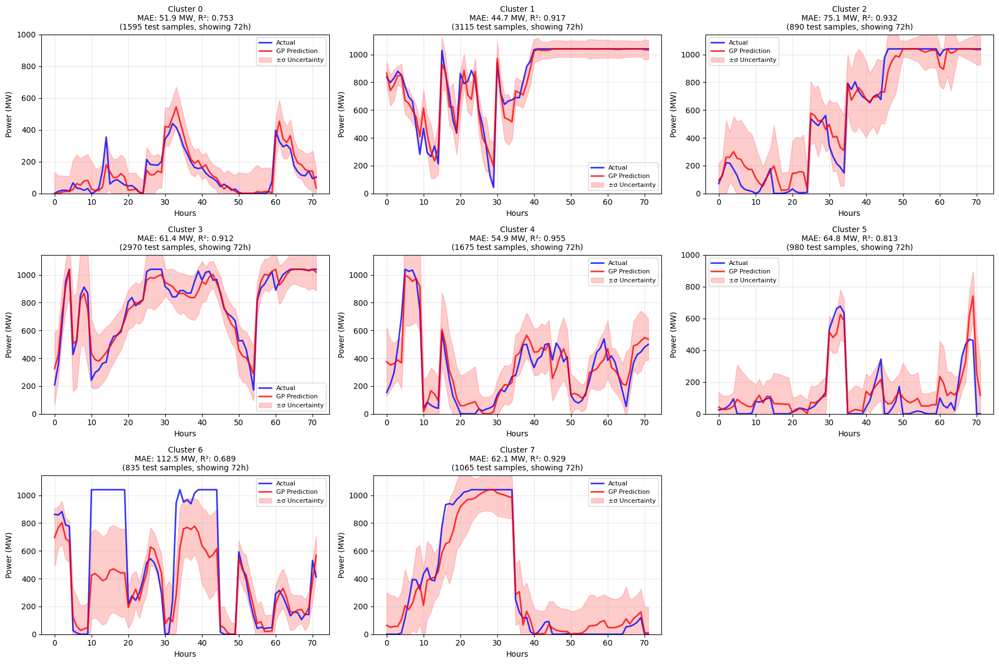


Prediction Plot Summary:
Cluster 0: MAE=51.9 MW, R²=0.753 (1595 test points)
Cluster 1: MAE=44.7 MW, R²=0.917 (3115 test points)
Cluster 2: MAE=75.1 MW, R²=0.932 (890 test points)
Cluster 3: MAE=61.4 MW, R²=0.912 (2970 test points)
Cluster 4: MAE=54.9 MW, R²=0.955 (1675 test points)
Cluster 5: MAE=64.8 MW, R²=0.813 (980 test points)
Cluster 6: MAE=112.5 MW, R²=0.689 (835 test points)
Cluster 7: MAE=62.1 MW, R²=0.929 (1065 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 20.0% for training, 80.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 583 train periods and 2333 test periods
  Train: 583 periods, Test: 2333 periods

Step 3: Normalising data.

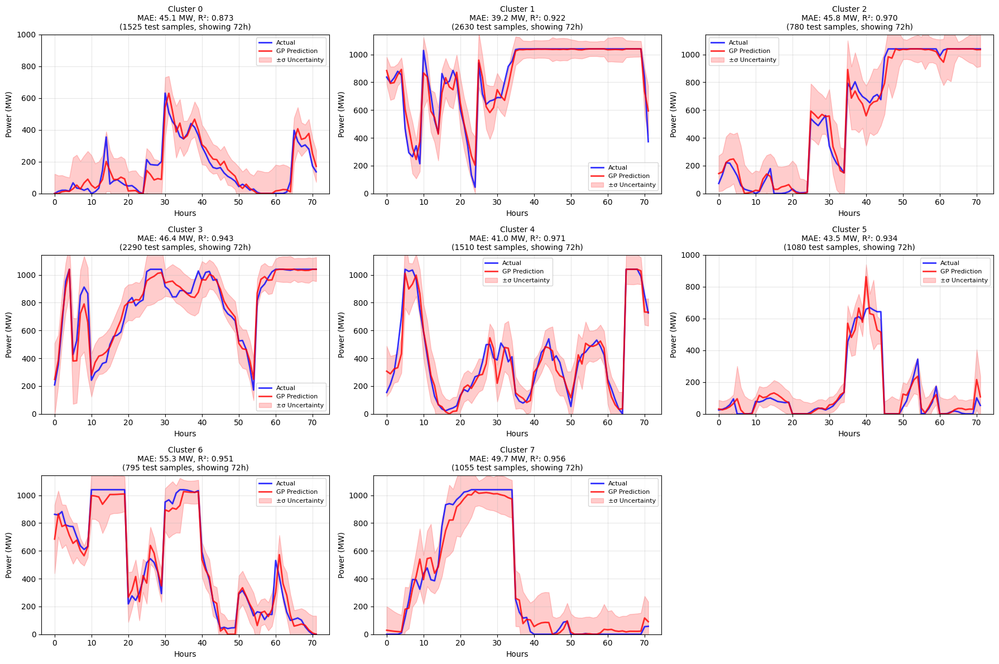


Prediction Plot Summary:
Cluster 0: MAE=45.1 MW, R²=0.873 (1525 test points)
Cluster 1: MAE=39.2 MW, R²=0.922 (2630 test points)
Cluster 2: MAE=45.8 MW, R²=0.970 (780 test points)
Cluster 3: MAE=46.4 MW, R²=0.943 (2290 test points)
Cluster 4: MAE=41.0 MW, R²=0.971 (1510 test points)
Cluster 5: MAE=43.5 MW, R²=0.934 (1080 test points)
Cluster 6: MAE=55.3 MW, R²=0.951 (795 test points)
Cluster 7: MAE=49.7 MW, R²=0.956 (1055 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 30.0% for training, 70.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 874 train periods and 2042 test periods
  Train: 874 periods, Test: 2042 periods

Step 3: Normalising data.

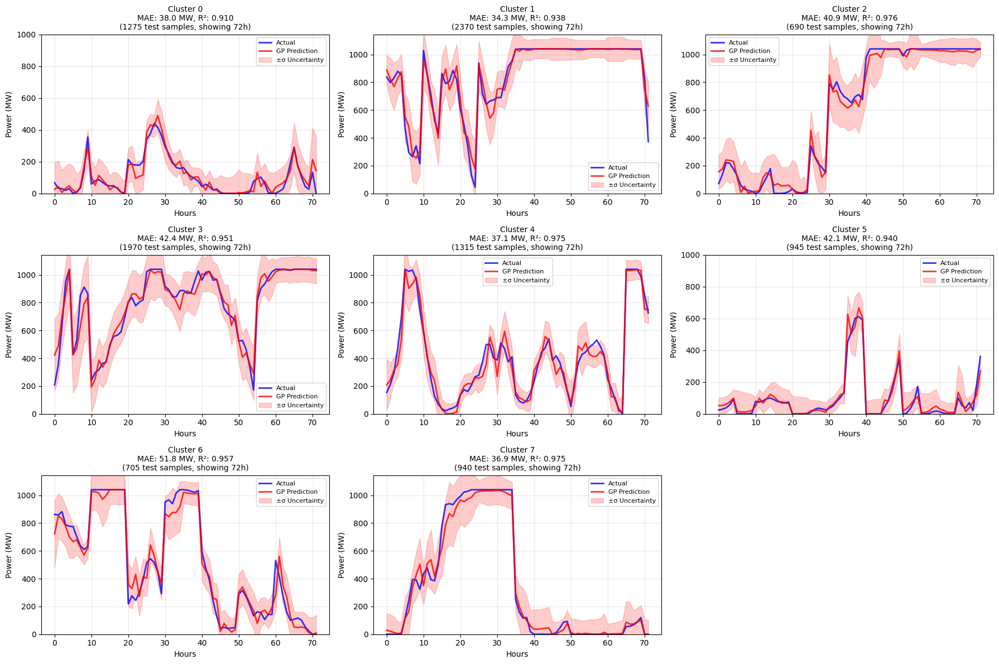


Prediction Plot Summary:
Cluster 0: MAE=38.0 MW, R²=0.910 (1275 test points)
Cluster 1: MAE=34.3 MW, R²=0.938 (2370 test points)
Cluster 2: MAE=40.9 MW, R²=0.976 (690 test points)
Cluster 3: MAE=42.4 MW, R²=0.951 (1970 test points)
Cluster 4: MAE=37.1 MW, R²=0.975 (1315 test points)
Cluster 5: MAE=42.1 MW, R²=0.940 (945 test points)
Cluster 6: MAE=51.8 MW, R²=0.957 (705 test points)
Cluster 7: MAE=36.9 MW, R²=0.975 (940 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 40.0% for training, 60.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 1166 train periods and 1750 test periods
  Train: 1166 periods, Test: 1750 periods

Step 3: Normalising data.

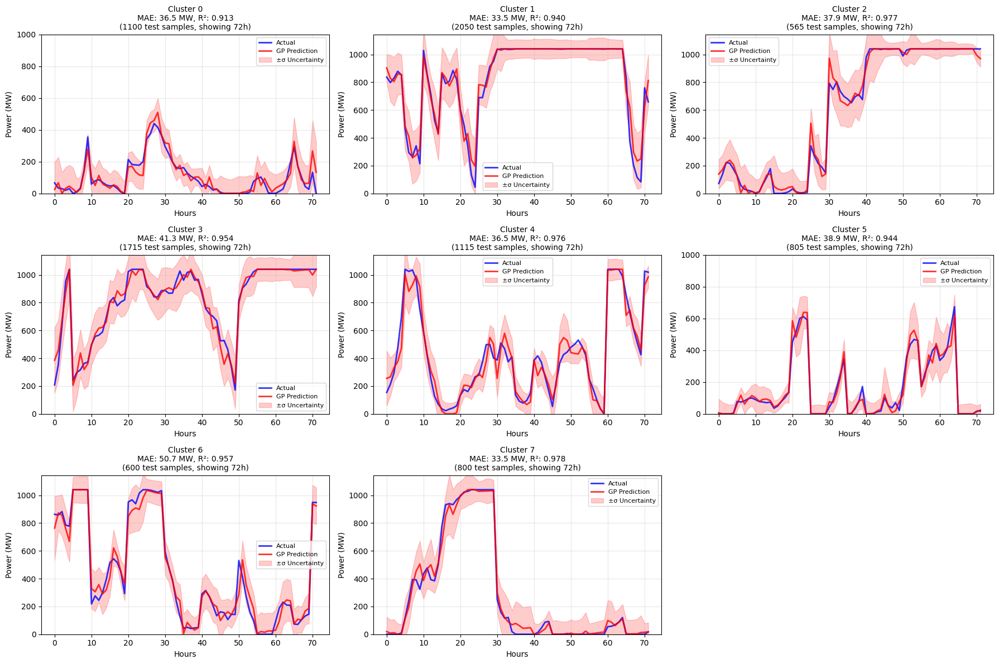


Prediction Plot Summary:
Cluster 0: MAE=36.5 MW, R²=0.913 (1100 test points)
Cluster 1: MAE=33.5 MW, R²=0.940 (2050 test points)
Cluster 2: MAE=37.9 MW, R²=0.977 (565 test points)
Cluster 3: MAE=41.3 MW, R²=0.954 (1715 test points)
Cluster 4: MAE=36.5 MW, R²=0.976 (1115 test points)
Cluster 5: MAE=38.9 MW, R²=0.944 (805 test points)
Cluster 6: MAE=50.7 MW, R²=0.957 (600 test points)
Cluster 7: MAE=33.5 MW, R²=0.978 (800 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 50.0% for training, 50.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 1458 train periods and 1458 test periods
  Train: 1458 periods, Test: 1458 periods

Step 3: Normalising data.

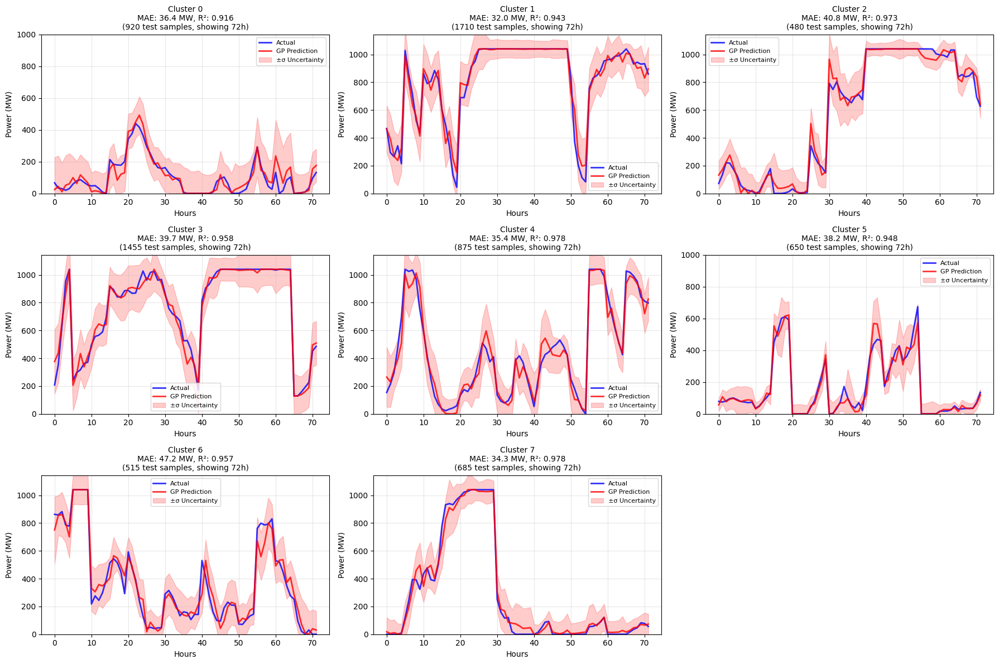


Prediction Plot Summary:
Cluster 0: MAE=36.4 MW, R²=0.916 (920 test points)
Cluster 1: MAE=32.0 MW, R²=0.943 (1710 test points)
Cluster 2: MAE=40.8 MW, R²=0.973 (480 test points)
Cluster 3: MAE=39.7 MW, R²=0.958 (1455 test points)
Cluster 4: MAE=35.4 MW, R²=0.978 (875 test points)
Cluster 5: MAE=38.2 MW, R²=0.948 (650 test points)
Cluster 6: MAE=47.2 MW, R²=0.957 (515 test points)
Cluster 7: MAE=34.3 MW, R²=0.978 (685 test points)

SUMMARY ACROSS ALL DATA FRACTIONS
 10%: MAE=65.93±19.54 MW, R²=0.863±0.092
 20%: MAE=45.76±4.70 MW, R²=0.940±0.030
 30%: MAE=40.42±5.05 MW, R²=0.953±0.022
 40%: MAE=38.61±5.20 MW, R²=0.955±0.021
 50%: MAE=38.02±4.40 MW, R²=0.956±0.020


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Seagreen
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=r'/mnt/d/Dominic/Personal/UCL/Research Project/Models/GPs/Final_GPs',
        plot_predictions_flag=True,
        random_state=84
    )
    results_by_fraction[frac] = results['overall_metrics']


print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2913 6-hour continuous periods
  Skipped 4 periods due to temporal discontinuities
  Full matrix shape: (2913, 17, 6)
  VAE matrix shape: (2913, 6, 6)
  Extracted 2913 time periods

Step 2: Splitting data...
Timeseries randomly split into 291 train periods and 2622 test periods
  Train: 291 periods, Test: 2622 periods

Step 3: Normalising data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL training data statistics...
  Applying log transform to fsr
  Skipping normalisation for hour_sin (cyclical feature)
  Skipping normalis

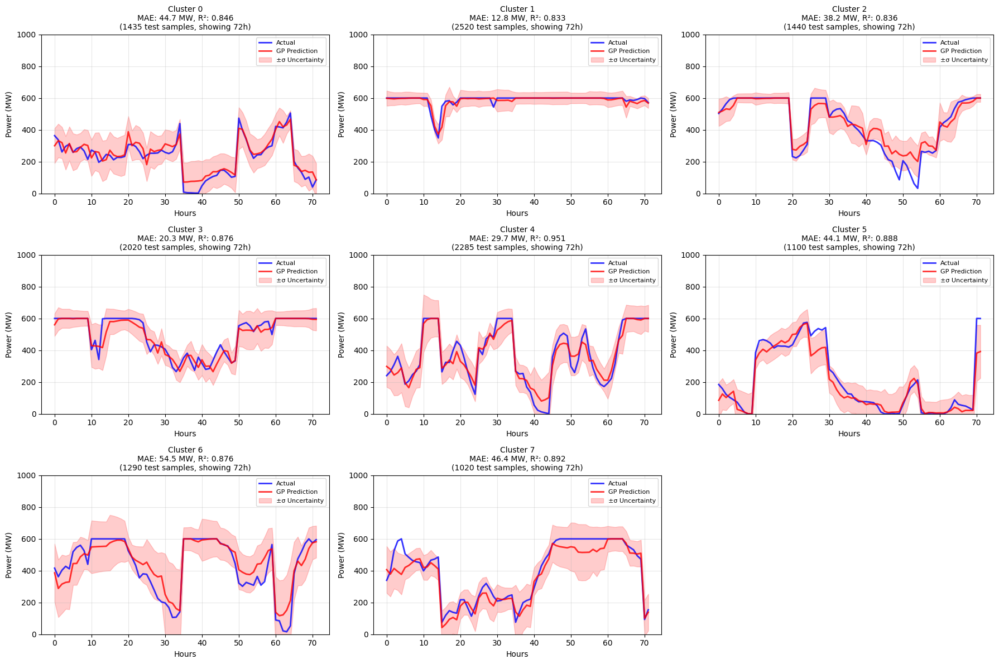


Prediction Plot Summary:
Cluster 0: MAE=44.7 MW, R²=0.846 (1435 test points)
Cluster 1: MAE=12.8 MW, R²=0.833 (2520 test points)
Cluster 2: MAE=38.2 MW, R²=0.836 (1440 test points)
Cluster 3: MAE=20.3 MW, R²=0.876 (2020 test points)
Cluster 4: MAE=29.7 MW, R²=0.951 (2285 test points)
Cluster 5: MAE=44.1 MW, R²=0.888 (1100 test points)
Cluster 6: MAE=54.5 MW, R²=0.876 (1290 test points)
Cluster 7: MAE=46.4 MW, R²=0.892 (1020 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 20.0% for training, 80.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2913 6-hour continuous periods
  Skipped 4 periods due to temporal discontinuities
  Full matrix shape: (2913, 17, 6)
  VAE matrix shape: (2913, 6, 6)
  Extracted 2913 time periods

Step 2: Splitting data...
Timeseries randomly split into 582 train periods and 2331 test periods
  Train: 582 periods, Test: 2331 periods

Step 3: Normalising dat

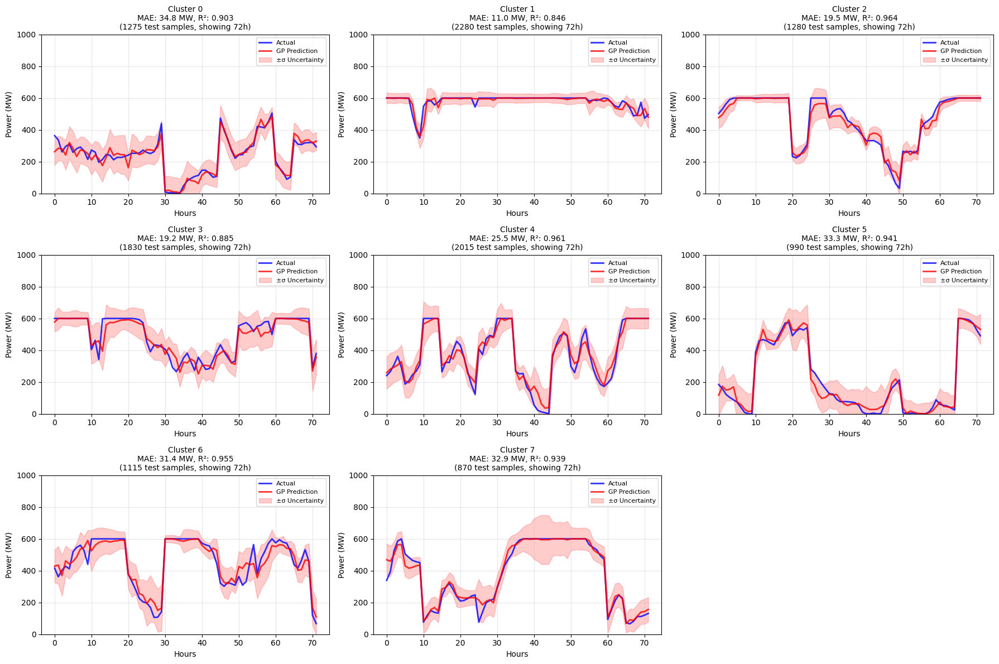


Prediction Plot Summary:
Cluster 0: MAE=34.8 MW, R²=0.903 (1275 test points)
Cluster 1: MAE=11.0 MW, R²=0.846 (2280 test points)
Cluster 2: MAE=19.5 MW, R²=0.964 (1280 test points)
Cluster 3: MAE=19.2 MW, R²=0.885 (1830 test points)
Cluster 4: MAE=25.5 MW, R²=0.961 (2015 test points)
Cluster 5: MAE=33.3 MW, R²=0.941 (990 test points)
Cluster 6: MAE=31.4 MW, R²=0.955 (1115 test points)
Cluster 7: MAE=32.9 MW, R²=0.939 (870 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 30.0% for training, 70.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2913 6-hour continuous periods
  Skipped 4 periods due to temporal discontinuities
  Full matrix shape: (2913, 17, 6)
  VAE matrix shape: (2913, 6, 6)
  Extracted 2913 time periods

Step 2: Splitting data...
Timeseries randomly split into 873 train periods and 2040 test periods
  Train: 873 periods, Test: 2040 periods

Step 3: Normalising data.

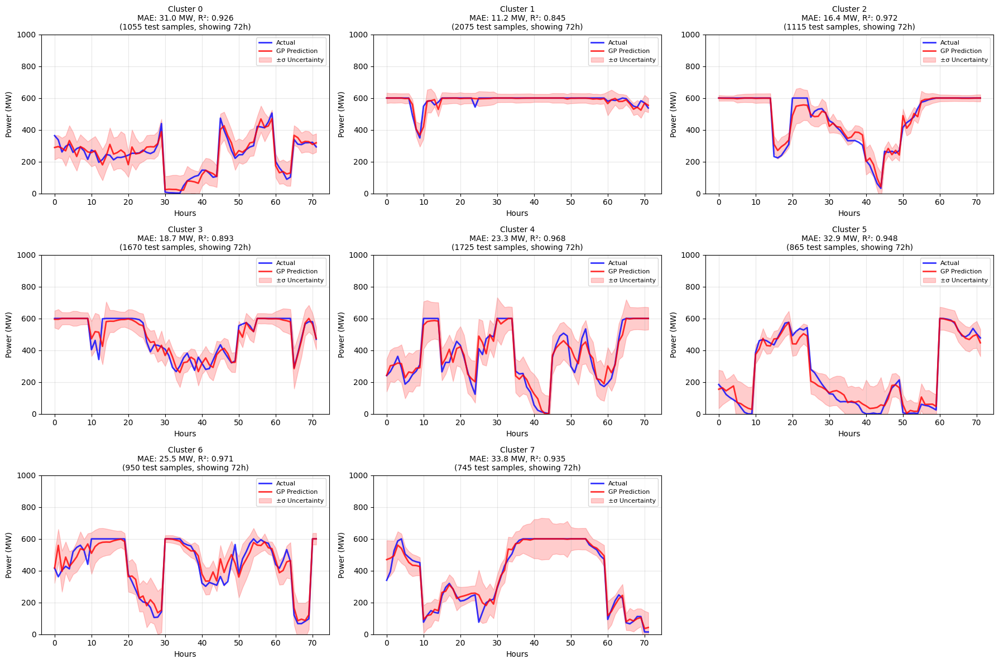


Prediction Plot Summary:
Cluster 0: MAE=31.0 MW, R²=0.926 (1055 test points)
Cluster 1: MAE=11.2 MW, R²=0.845 (2075 test points)
Cluster 2: MAE=16.4 MW, R²=0.972 (1115 test points)
Cluster 3: MAE=18.7 MW, R²=0.893 (1670 test points)
Cluster 4: MAE=23.3 MW, R²=0.968 (1725 test points)
Cluster 5: MAE=32.9 MW, R²=0.948 (865 test points)
Cluster 6: MAE=25.5 MW, R²=0.971 (950 test points)
Cluster 7: MAE=33.8 MW, R²=0.935 (745 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 40.0% for training, 60.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2913 6-hour continuous periods
  Skipped 4 periods due to temporal discontinuities
  Full matrix shape: (2913, 17, 6)
  VAE matrix shape: (2913, 6, 6)
  Extracted 2913 time periods

Step 2: Splitting data...
Timeseries randomly split into 1165 train periods and 1748 test periods
  Train: 1165 periods, Test: 1748 periods

Step 3: Normalising data

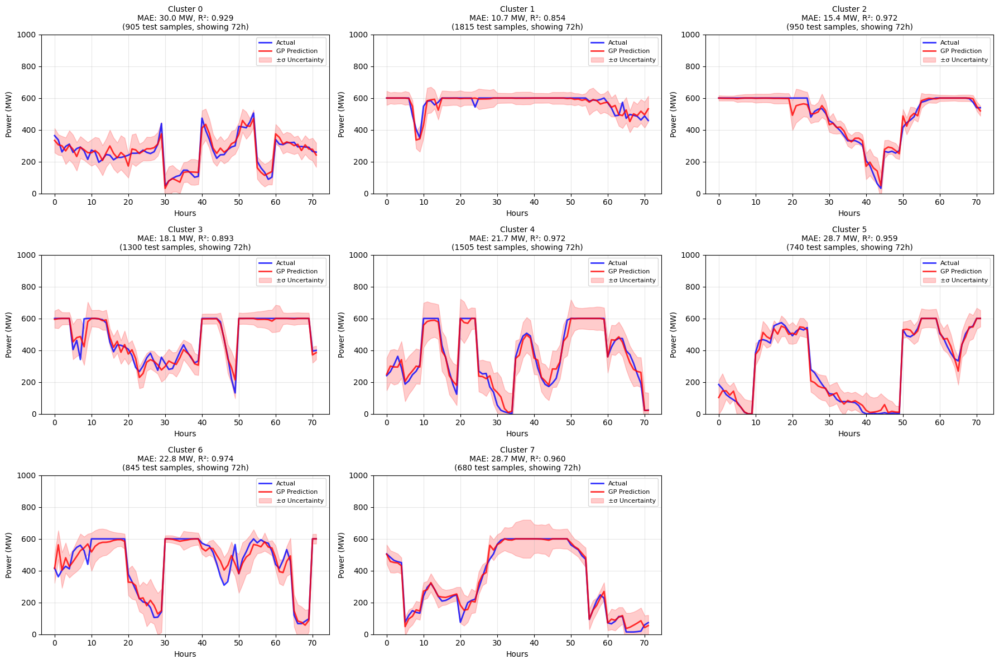


Prediction Plot Summary:
Cluster 0: MAE=30.0 MW, R²=0.929 (905 test points)
Cluster 1: MAE=10.7 MW, R²=0.854 (1815 test points)
Cluster 2: MAE=15.4 MW, R²=0.972 (950 test points)
Cluster 3: MAE=18.1 MW, R²=0.893 (1300 test points)
Cluster 4: MAE=21.7 MW, R²=0.972 (1505 test points)
Cluster 5: MAE=28.7 MW, R²=0.959 (740 test points)
Cluster 6: MAE=22.8 MW, R²=0.974 (845 test points)
Cluster 7: MAE=28.7 MW, R²=0.960 (680 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 50.0% for training, 50.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2913 6-hour continuous periods
  Skipped 4 periods due to temporal discontinuities
  Full matrix shape: (2913, 17, 6)
  VAE matrix shape: (2913, 6, 6)
  Extracted 2913 time periods

Step 2: Splitting data...
Timeseries randomly split into 1456 train periods and 1457 test periods
  Train: 1456 periods, Test: 1457 periods

Step 3: Normalising data..

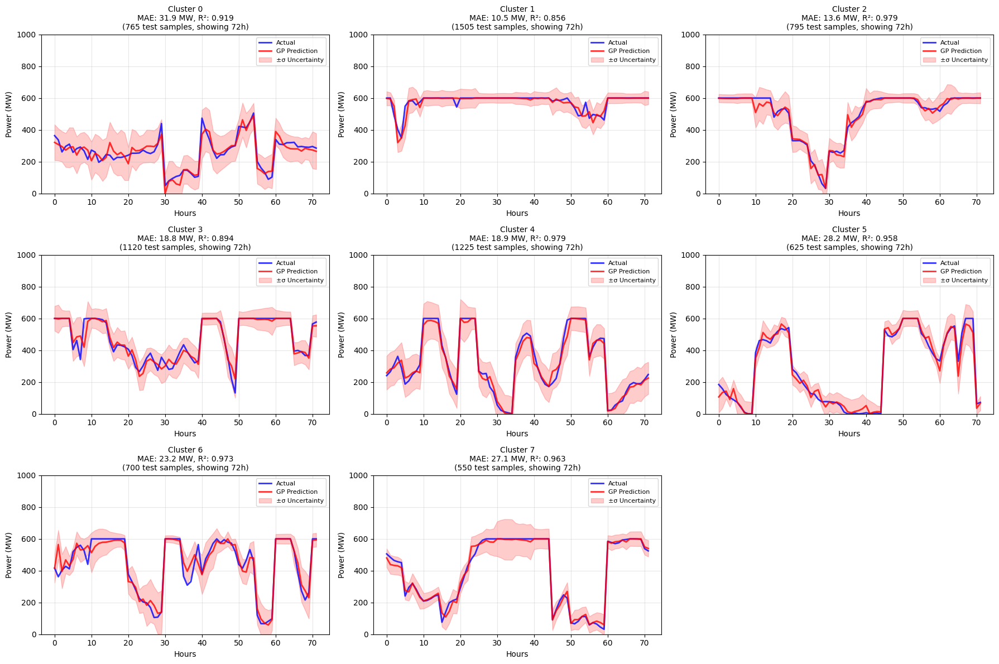


Prediction Plot Summary:
Cluster 0: MAE=31.9 MW, R²=0.919 (765 test points)
Cluster 1: MAE=10.5 MW, R²=0.856 (1505 test points)
Cluster 2: MAE=13.6 MW, R²=0.979 (795 test points)
Cluster 3: MAE=18.8 MW, R²=0.894 (1120 test points)
Cluster 4: MAE=18.9 MW, R²=0.979 (1225 test points)
Cluster 5: MAE=28.2 MW, R²=0.958 (625 test points)
Cluster 6: MAE=23.2 MW, R²=0.973 (700 test points)
Cluster 7: MAE=27.1 MW, R²=0.963 (550 test points)

SUMMARY ACROSS ALL DATA FRACTIONS
 10%: MAE=36.33±13.32 MW, R²=0.875±0.036
 20%: MAE=25.96±8.08 MW, R²=0.924±0.039
 30%: MAE=24.11±7.72 MW, R²=0.932±0.042
 40%: MAE=22.01±6.55 MW, R²=0.939±0.041
 50%: MAE=21.51±6.94 MW, R²=0.940±0.043


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Gemini
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=r'/mnt/d/Dominic/Personal/UCL/Research Project/Models/GPs/Final_GPs',
        plot_predictions_flag=True,
        random_state=84
    )
    results_by_fraction[frac] = results['overall_metrics']


print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 291 train periods and 2625 test periods
  Train: 291 periods, Test: 2625 periods

Step 3: Normalising data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL training data statistics...
  Applying log transform to fsr
  Skipping normalisation for hour_sin (cyclical feature)
  Skipping normalis

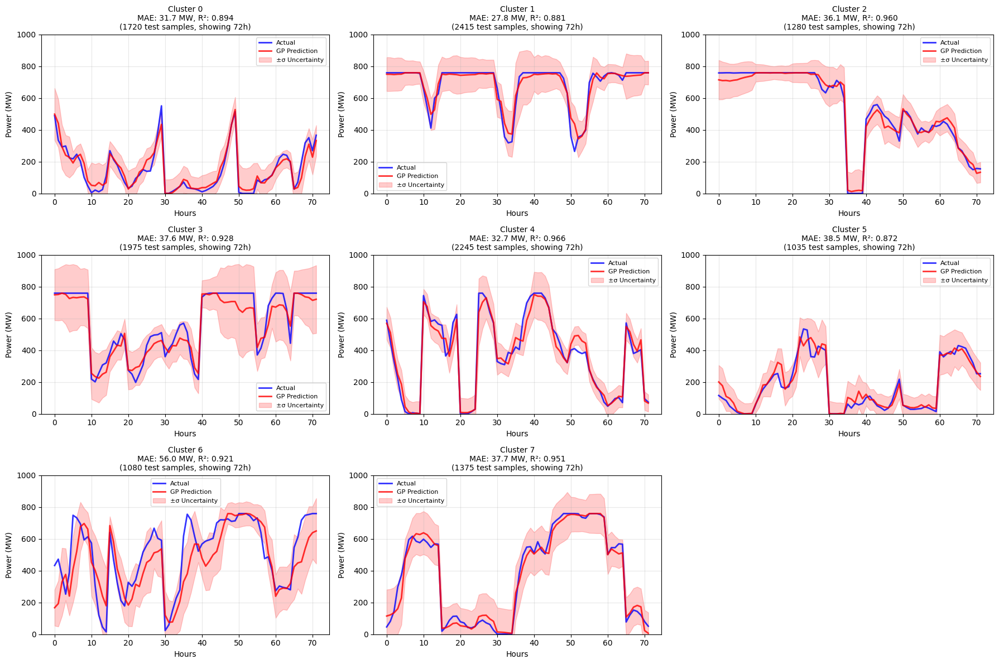


Prediction Plot Summary:
Cluster 0: MAE=31.7 MW, R²=0.894 (1720 test points)
Cluster 1: MAE=27.8 MW, R²=0.881 (2415 test points)
Cluster 2: MAE=36.1 MW, R²=0.960 (1280 test points)
Cluster 3: MAE=37.6 MW, R²=0.928 (1975 test points)
Cluster 4: MAE=32.7 MW, R²=0.966 (2245 test points)
Cluster 5: MAE=38.5 MW, R²=0.872 (1035 test points)
Cluster 6: MAE=56.0 MW, R²=0.921 (1080 test points)
Cluster 7: MAE=37.7 MW, R²=0.951 (1375 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 20.0% for training, 80.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 583 train periods and 2333 test periods
  Train: 583 periods, Test: 2333 periods

Step 3: Normalising dat

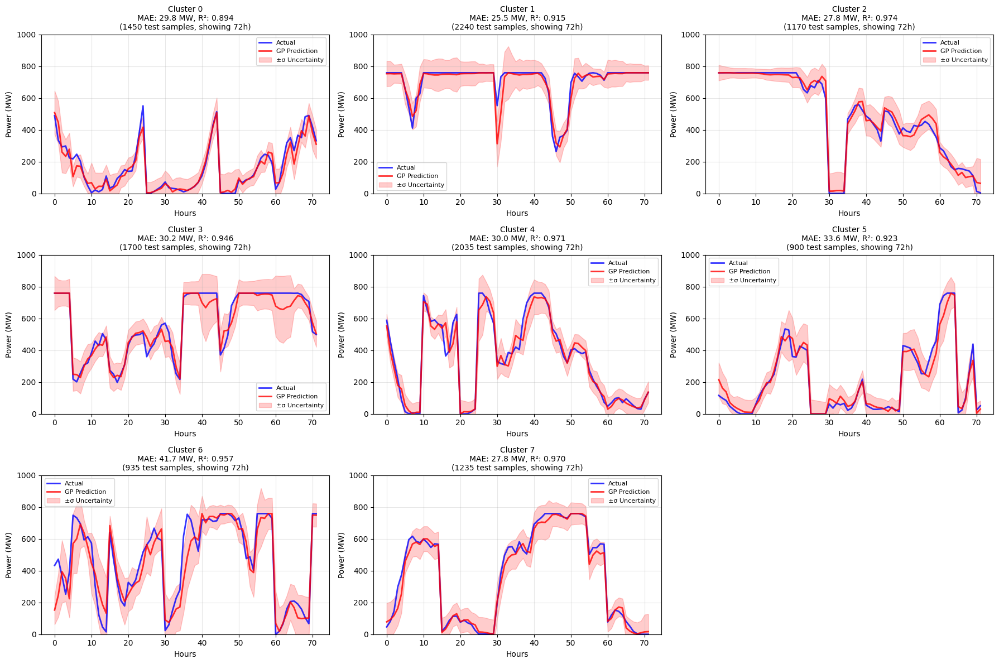


Prediction Plot Summary:
Cluster 0: MAE=29.8 MW, R²=0.894 (1450 test points)
Cluster 1: MAE=25.5 MW, R²=0.915 (2240 test points)
Cluster 2: MAE=27.8 MW, R²=0.974 (1170 test points)
Cluster 3: MAE=30.2 MW, R²=0.946 (1700 test points)
Cluster 4: MAE=30.0 MW, R²=0.971 (2035 test points)
Cluster 5: MAE=33.6 MW, R²=0.923 (900 test points)
Cluster 6: MAE=41.7 MW, R²=0.957 (935 test points)
Cluster 7: MAE=27.8 MW, R²=0.970 (1235 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 30.0% for training, 70.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 874 train periods and 2042 test periods
  Train: 874 periods, Test: 2042 periods

Step 3: Normalising data.

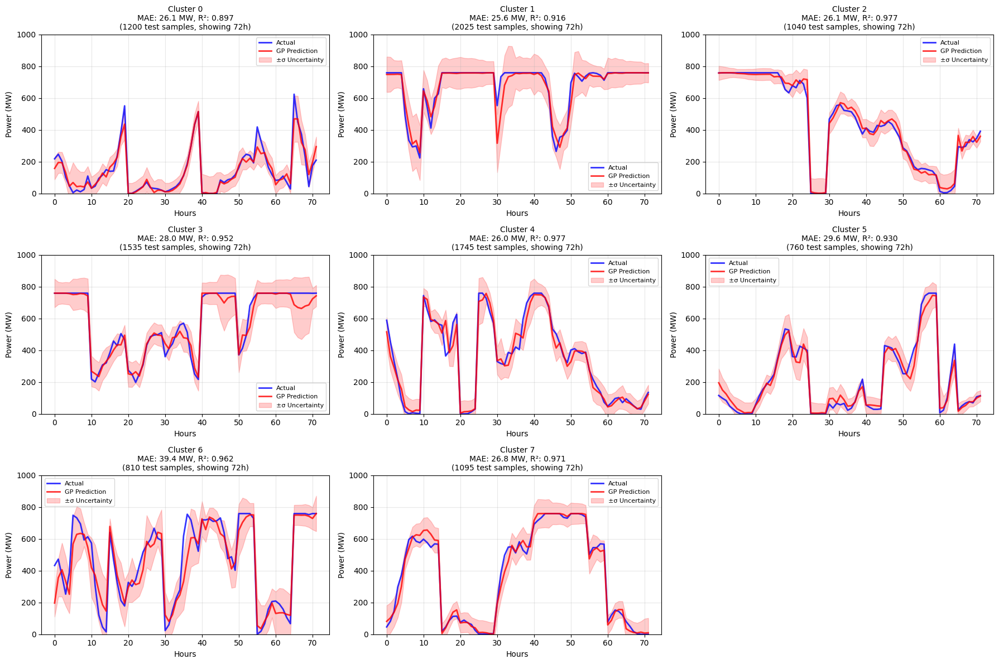


Prediction Plot Summary:
Cluster 0: MAE=26.1 MW, R²=0.897 (1200 test points)
Cluster 1: MAE=25.6 MW, R²=0.916 (2025 test points)
Cluster 2: MAE=26.1 MW, R²=0.977 (1040 test points)
Cluster 3: MAE=28.0 MW, R²=0.952 (1535 test points)
Cluster 4: MAE=26.0 MW, R²=0.977 (1745 test points)
Cluster 5: MAE=29.6 MW, R²=0.930 (760 test points)
Cluster 6: MAE=39.4 MW, R²=0.962 (810 test points)
Cluster 7: MAE=26.8 MW, R²=0.971 (1095 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 40.0% for training, 60.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 1166 train periods and 1750 test periods
  Train: 1166 periods, Test: 1750 periods

Step 3: Normalising dat

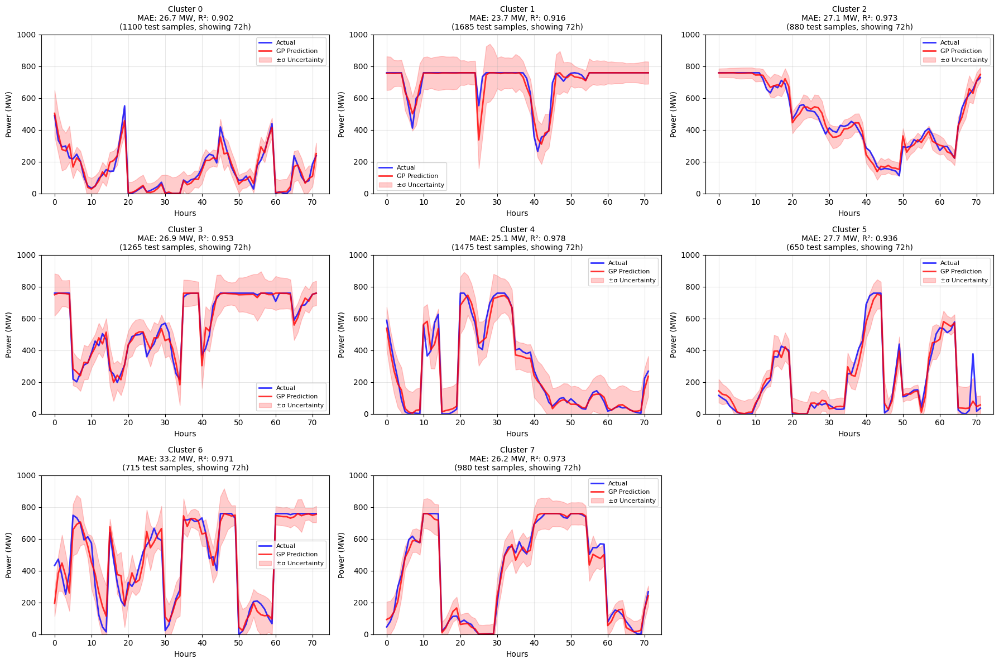


Prediction Plot Summary:
Cluster 0: MAE=26.7 MW, R²=0.902 (1100 test points)
Cluster 1: MAE=23.7 MW, R²=0.916 (1685 test points)
Cluster 2: MAE=27.1 MW, R²=0.973 (880 test points)
Cluster 3: MAE=26.9 MW, R²=0.953 (1265 test points)
Cluster 4: MAE=25.1 MW, R²=0.978 (1475 test points)
Cluster 5: MAE=27.7 MW, R²=0.936 (650 test points)
Cluster 6: MAE=33.2 MW, R²=0.971 (715 test points)
Cluster 7: MAE=26.2 MW, R²=0.973 (980 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 50.0% for training, 50.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 1458 train periods and 1458 test periods
  Train: 1458 periods, Test: 1458 periods

Step 3: Normalising data.

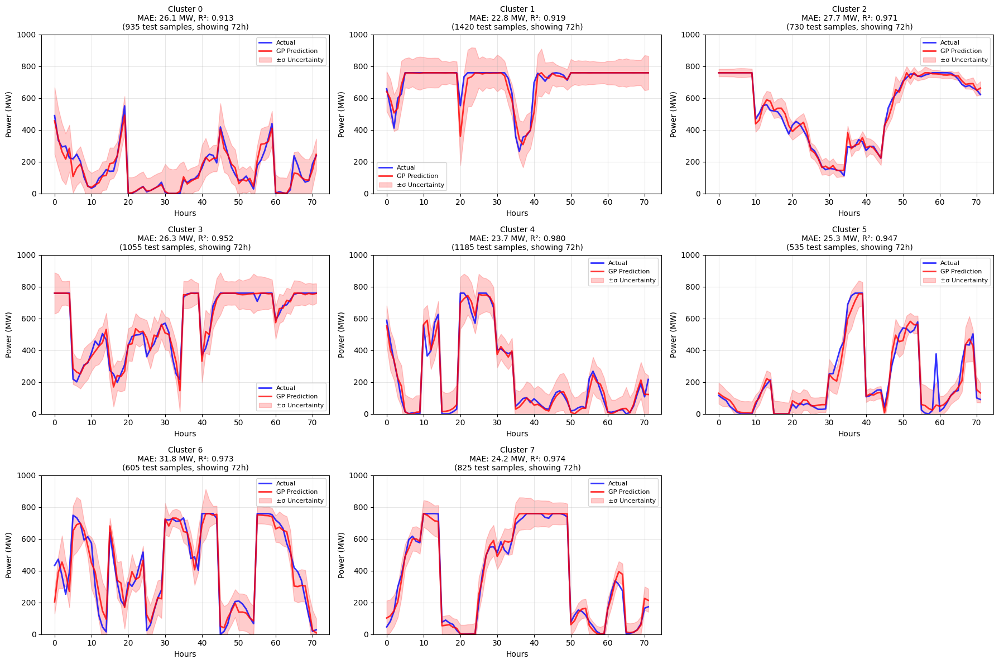


Prediction Plot Summary:
Cluster 0: MAE=26.1 MW, R²=0.913 (935 test points)
Cluster 1: MAE=22.8 MW, R²=0.919 (1420 test points)
Cluster 2: MAE=27.7 MW, R²=0.971 (730 test points)
Cluster 3: MAE=26.3 MW, R²=0.952 (1055 test points)
Cluster 4: MAE=23.7 MW, R²=0.980 (1185 test points)
Cluster 5: MAE=25.3 MW, R²=0.947 (535 test points)
Cluster 6: MAE=31.8 MW, R²=0.973 (605 test points)
Cluster 7: MAE=24.2 MW, R²=0.974 (825 test points)

SUMMARY ACROSS ALL DATA FRACTIONS
 10%: MAE=37.27±7.88 MW, R²=0.922±0.034
 20%: MAE=30.81±4.66 MW, R²=0.944±0.028
 30%: MAE=28.45±4.31 MW, R²=0.948±0.028
 40%: MAE=27.08±2.62 MW, R²=0.950±0.027
 50%: MAE=26.01±2.65 MW, R²=0.954±0.024


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Hollanse_Noord
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=r'/mnt/d/Dominic/Personal/UCL/Research Project/Models/GPs/Final_GPs',
        plot_predictions_flag=True,
        random_state=84
    )
    results_by_fraction[frac] = results['overall_metrics']


print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 3 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 291 train periods and 2625 test periods
  Train: 291 periods, Test: 2625 periods

Step 3: Normalising data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL training data statistics...
  Applying log transform to fsr
  Skipping normalisation for hour_sin (cyclical feature)
  Skipping normalis

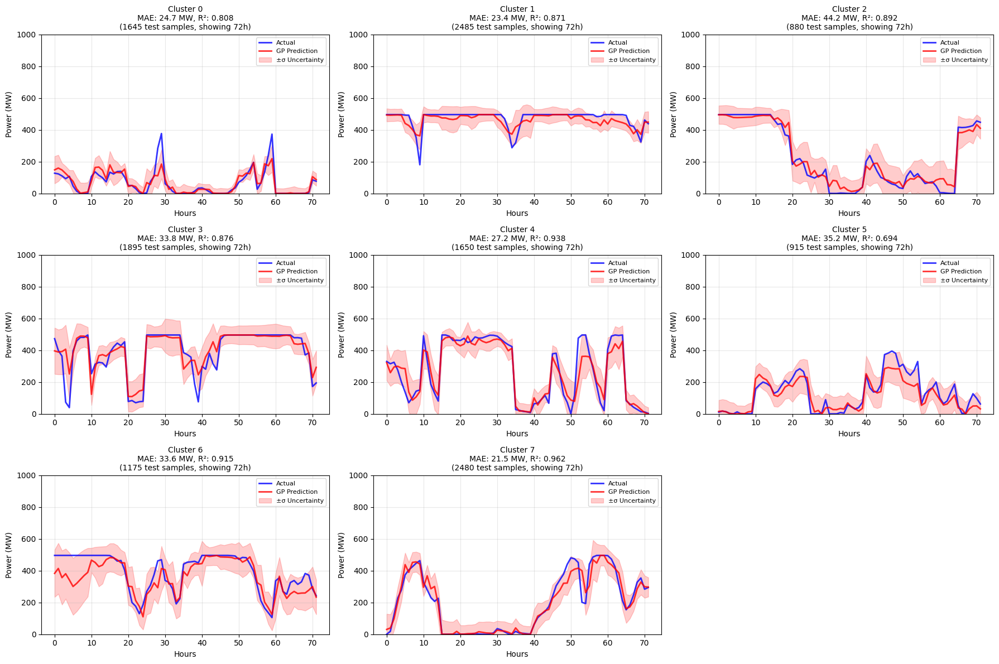


Prediction Plot Summary:
Cluster 0: MAE=24.7 MW, R²=0.808 (1645 test points)
Cluster 1: MAE=23.4 MW, R²=0.871 (2485 test points)
Cluster 2: MAE=44.2 MW, R²=0.892 (880 test points)
Cluster 3: MAE=33.8 MW, R²=0.876 (1895 test points)
Cluster 4: MAE=27.2 MW, R²=0.938 (1650 test points)
Cluster 5: MAE=35.2 MW, R²=0.694 (915 test points)
Cluster 6: MAE=33.6 MW, R²=0.915 (1175 test points)
Cluster 7: MAE=21.5 MW, R²=0.962 (2480 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 20.0% for training, 80.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 3 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 583 train periods and 2333 test periods
  Train: 583 periods, Test: 2333 periods

Step 3: Normalising data.

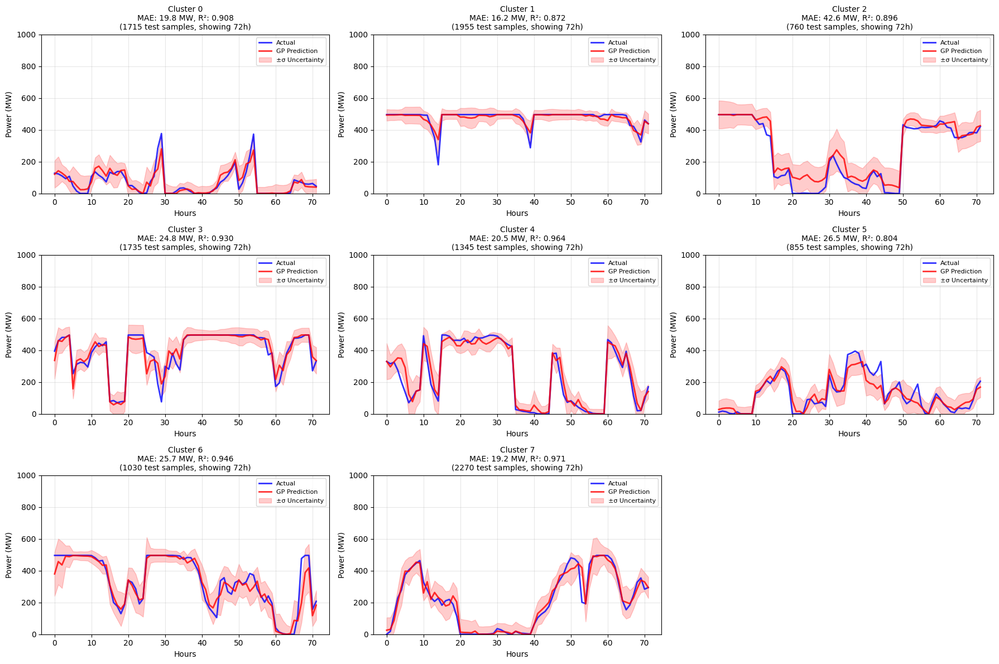


Prediction Plot Summary:
Cluster 0: MAE=19.8 MW, R²=0.908 (1715 test points)
Cluster 1: MAE=16.2 MW, R²=0.872 (1955 test points)
Cluster 2: MAE=42.6 MW, R²=0.896 (760 test points)
Cluster 3: MAE=24.8 MW, R²=0.930 (1735 test points)
Cluster 4: MAE=20.5 MW, R²=0.964 (1345 test points)
Cluster 5: MAE=26.5 MW, R²=0.804 (855 test points)
Cluster 6: MAE=25.7 MW, R²=0.946 (1030 test points)
Cluster 7: MAE=19.2 MW, R²=0.971 (2270 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 30.0% for training, 70.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 3 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 874 train periods and 2042 test periods
  Train: 874 periods, Test: 2042 periods

Step 3: Normalising data.

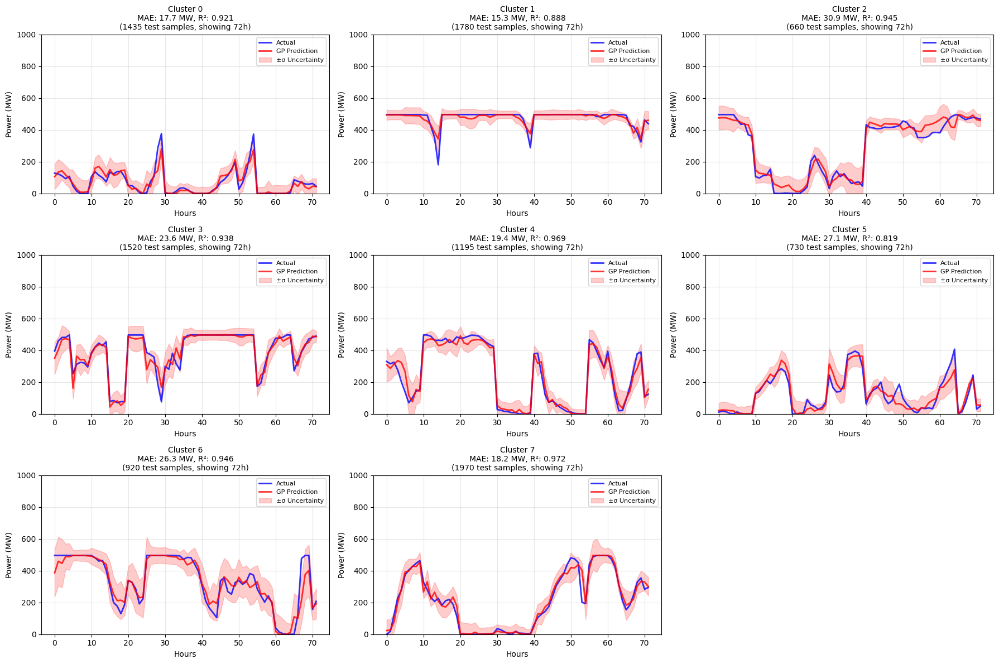


Prediction Plot Summary:
Cluster 0: MAE=17.7 MW, R²=0.921 (1435 test points)
Cluster 1: MAE=15.3 MW, R²=0.888 (1780 test points)
Cluster 2: MAE=30.9 MW, R²=0.945 (660 test points)
Cluster 3: MAE=23.6 MW, R²=0.938 (1520 test points)
Cluster 4: MAE=19.4 MW, R²=0.969 (1195 test points)
Cluster 5: MAE=27.1 MW, R²=0.819 (730 test points)
Cluster 6: MAE=26.3 MW, R²=0.946 (920 test points)
Cluster 7: MAE=18.2 MW, R²=0.972 (1970 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 40.0% for training, 60.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 3 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 1166 train periods and 1750 test periods
  Train: 1166 periods, Test: 1750 periods

Step 3: Normalising data

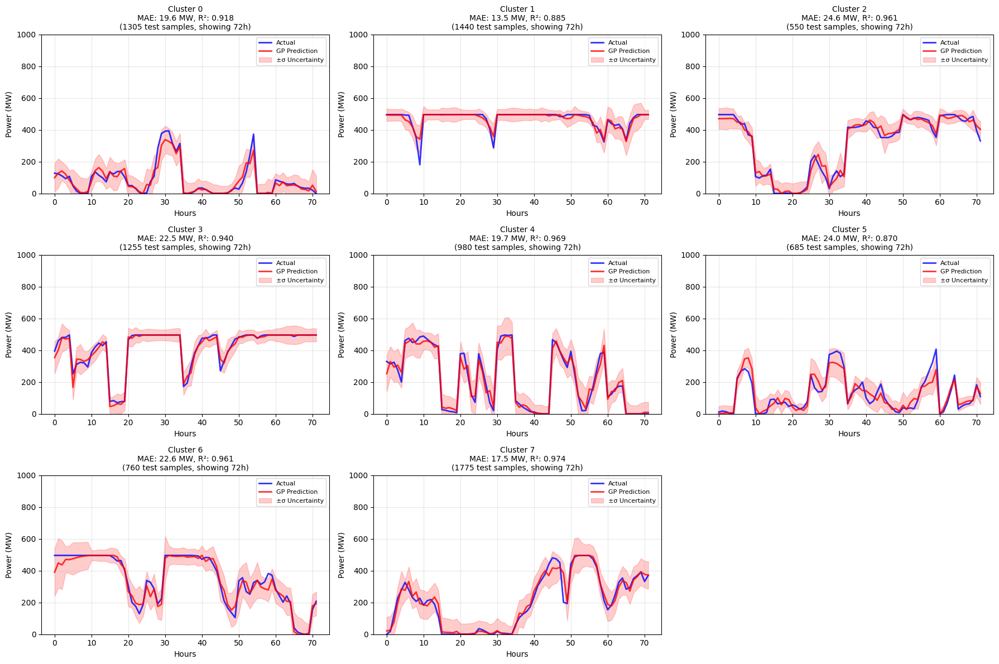


Prediction Plot Summary:
Cluster 0: MAE=19.6 MW, R²=0.918 (1305 test points)
Cluster 1: MAE=13.5 MW, R²=0.885 (1440 test points)
Cluster 2: MAE=24.6 MW, R²=0.961 (550 test points)
Cluster 3: MAE=22.5 MW, R²=0.940 (1255 test points)
Cluster 4: MAE=19.7 MW, R²=0.969 (980 test points)
Cluster 5: MAE=24.0 MW, R²=0.870 (685 test points)
Cluster 6: MAE=22.6 MW, R²=0.961 (760 test points)
Cluster 7: MAE=17.5 MW, R²=0.974 (1775 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 50.0% for training, 50.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 3 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 1458 train periods and 1458 test periods
  Train: 1458 periods, Test: 1458 periods

Step 3: Normalising data.

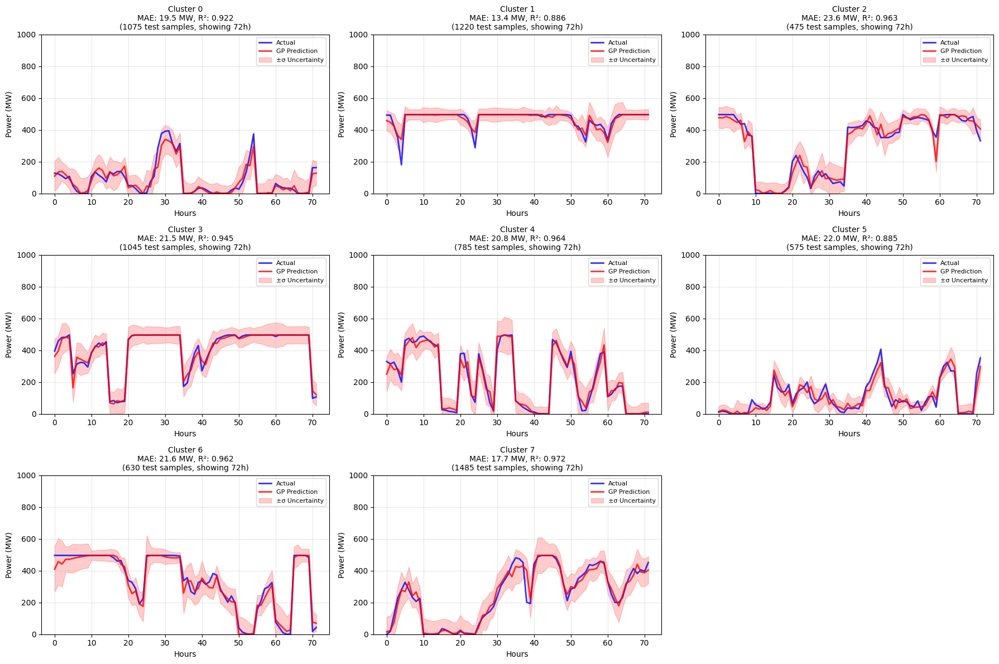


Prediction Plot Summary:
Cluster 0: MAE=19.5 MW, R²=0.922 (1075 test points)
Cluster 1: MAE=13.4 MW, R²=0.886 (1220 test points)
Cluster 2: MAE=23.6 MW, R²=0.963 (475 test points)
Cluster 3: MAE=21.5 MW, R²=0.945 (1045 test points)
Cluster 4: MAE=20.8 MW, R²=0.964 (785 test points)
Cluster 5: MAE=22.0 MW, R²=0.885 (575 test points)
Cluster 6: MAE=21.6 MW, R²=0.962 (630 test points)
Cluster 7: MAE=17.7 MW, R²=0.972 (1485 test points)

SUMMARY ACROSS ALL DATA FRACTIONS
 10%: MAE=30.46±7.12 MW, R²=0.870±0.079
 20%: MAE=24.42±7.67 MW, R²=0.911±0.052
 30%: MAE=22.31±5.12 MW, R²=0.925±0.047
 40%: MAE=20.48±3.47 MW, R²=0.935±0.037
 50%: MAE=20.00±2.99 MW, R²=0.937±0.033


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Dieppe
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=r'/mnt/d/Dominic/Personal/UCL/Research Project/Models/GPs/Final_GPs',
        plot_predictions_flag=True,
        random_state=84
    )
    results_by_fraction[frac] = results['overall_metrics']


print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2910 6-hour continuous periods
  Skipped 7 periods due to temporal discontinuities
  Full matrix shape: (2910, 17, 6)
  VAE matrix shape: (2910, 6, 6)
  Extracted 2910 time periods

Step 2: Splitting data...
Timeseries randomly split into 290 train periods and 2620 test periods
  Train: 290 periods, Test: 2620 periods

Step 3: Normalising data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL training data statistics...
  Applying log transform to fsr
  Skipping normalisation for hour_sin (cyclical feature)
  Skipping normalis

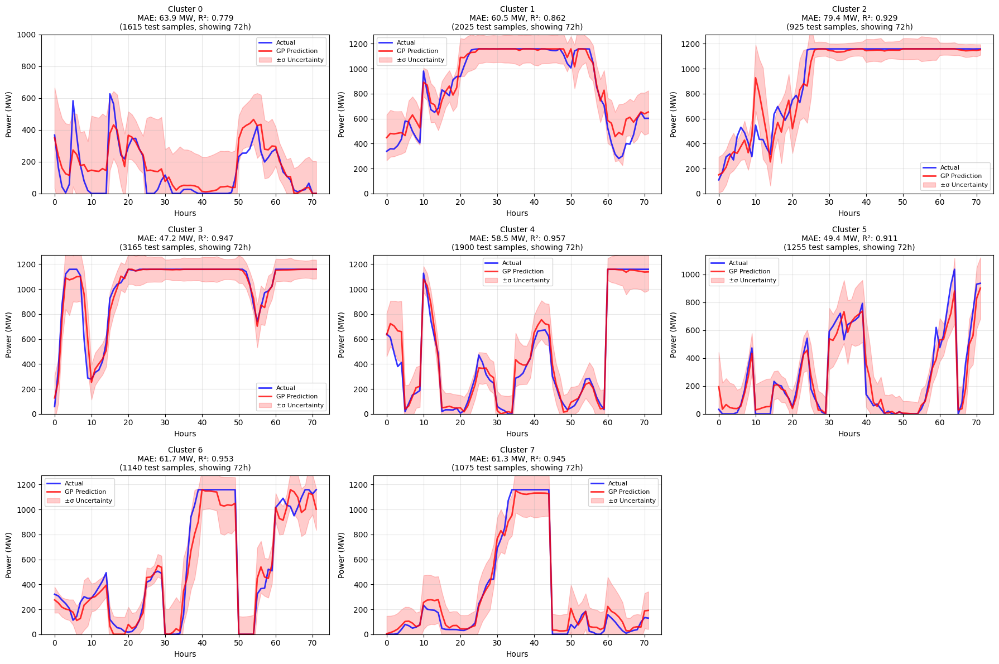


Prediction Plot Summary:
Cluster 0: MAE=63.9 MW, R²=0.779 (1615 test points)
Cluster 1: MAE=60.5 MW, R²=0.862 (2025 test points)
Cluster 2: MAE=79.4 MW, R²=0.929 (925 test points)
Cluster 3: MAE=47.2 MW, R²=0.947 (3165 test points)
Cluster 4: MAE=58.5 MW, R²=0.957 (1900 test points)
Cluster 5: MAE=49.4 MW, R²=0.911 (1255 test points)
Cluster 6: MAE=61.7 MW, R²=0.953 (1140 test points)
Cluster 7: MAE=61.3 MW, R²=0.945 (1075 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 20.0% for training, 80.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2910 6-hour continuous periods
  Skipped 7 periods due to temporal discontinuities
  Full matrix shape: (2910, 17, 6)
  VAE matrix shape: (2910, 6, 6)
  Extracted 2910 time periods

Step 2: Splitting data...
Timeseries randomly split into 581 train periods and 2329 test periods
  Train: 581 periods, Test: 2329 periods

Step 3: Normalising data

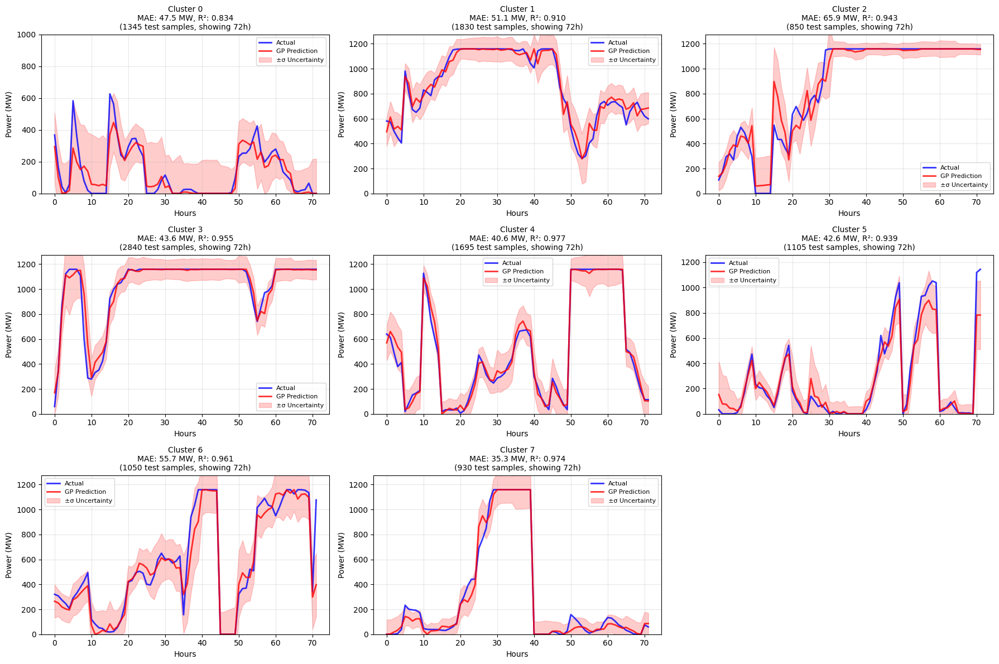


Prediction Plot Summary:
Cluster 0: MAE=47.5 MW, R²=0.834 (1345 test points)
Cluster 1: MAE=51.1 MW, R²=0.910 (1830 test points)
Cluster 2: MAE=65.9 MW, R²=0.943 (850 test points)
Cluster 3: MAE=43.6 MW, R²=0.955 (2840 test points)
Cluster 4: MAE=40.6 MW, R²=0.977 (1695 test points)
Cluster 5: MAE=42.6 MW, R²=0.939 (1105 test points)
Cluster 6: MAE=55.7 MW, R²=0.961 (1050 test points)
Cluster 7: MAE=35.3 MW, R²=0.974 (930 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 30.0% for training, 70.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2910 6-hour continuous periods
  Skipped 7 periods due to temporal discontinuities
  Full matrix shape: (2910, 17, 6)
  VAE matrix shape: (2910, 6, 6)
  Extracted 2910 time periods

Step 2: Splitting data...
Timeseries randomly split into 873 train periods and 2037 test periods
  Train: 873 periods, Test: 2037 periods

Step 3: Normalising data.

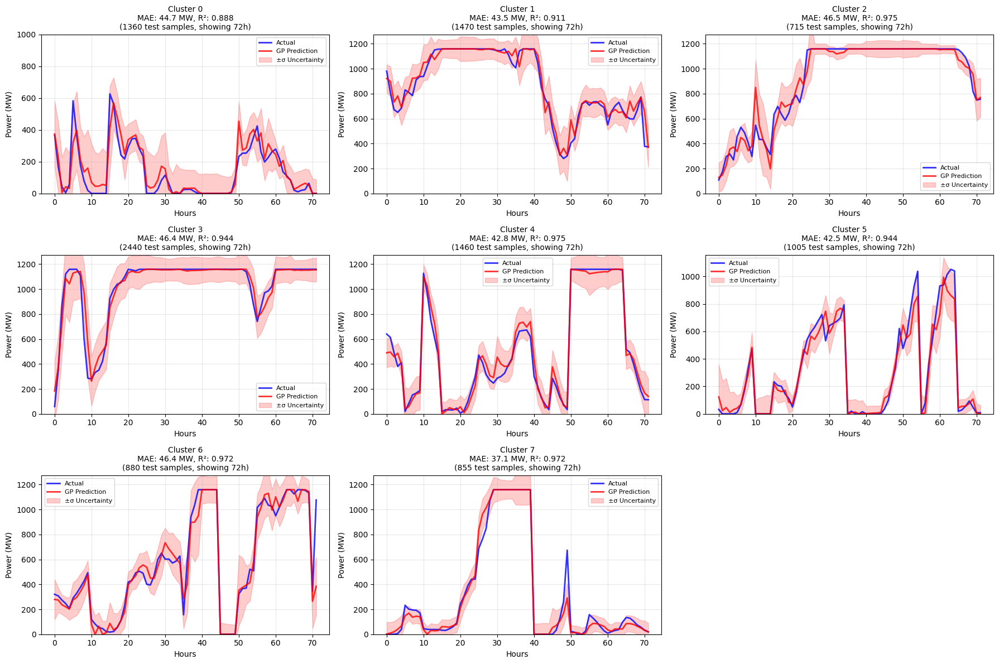


Prediction Plot Summary:
Cluster 0: MAE=44.7 MW, R²=0.888 (1360 test points)
Cluster 1: MAE=43.5 MW, R²=0.911 (1470 test points)
Cluster 2: MAE=46.5 MW, R²=0.975 (715 test points)
Cluster 3: MAE=46.4 MW, R²=0.944 (2440 test points)
Cluster 4: MAE=42.8 MW, R²=0.975 (1460 test points)
Cluster 5: MAE=42.5 MW, R²=0.944 (1005 test points)
Cluster 6: MAE=46.4 MW, R²=0.972 (880 test points)
Cluster 7: MAE=37.1 MW, R²=0.972 (855 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 40.0% for training, 60.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2910 6-hour continuous periods
  Skipped 7 periods due to temporal discontinuities
  Full matrix shape: (2910, 17, 6)
  VAE matrix shape: (2910, 6, 6)
  Extracted 2910 time periods

Step 2: Splitting data...
Timeseries randomly split into 1164 train periods and 1746 test periods
  Train: 1164 periods, Test: 1746 periods

Step 3: Normalising data

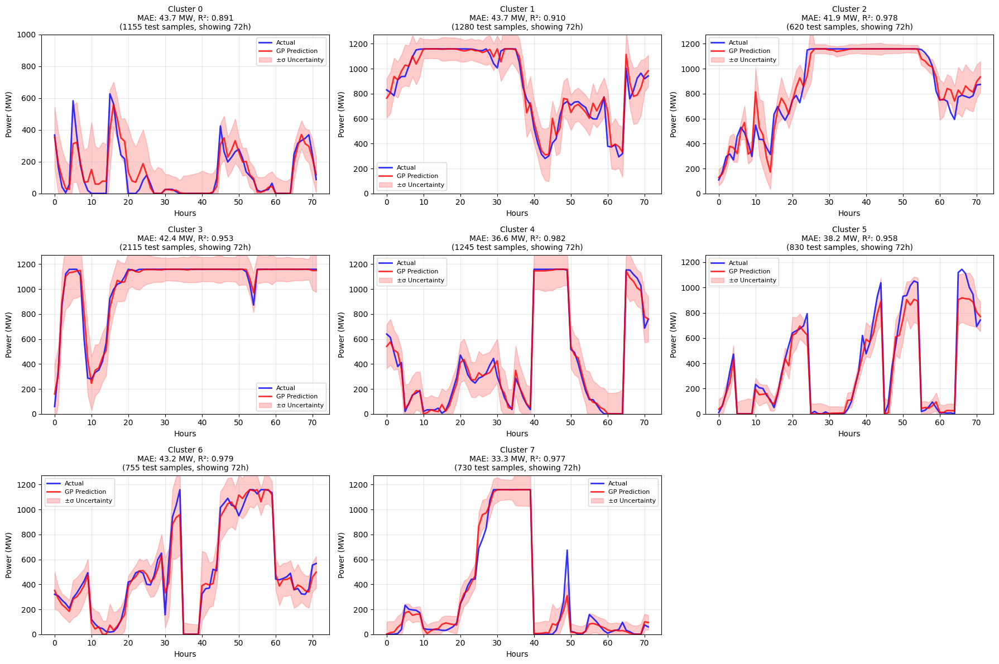


Prediction Plot Summary:
Cluster 0: MAE=43.7 MW, R²=0.891 (1155 test points)
Cluster 1: MAE=43.7 MW, R²=0.910 (1280 test points)
Cluster 2: MAE=41.9 MW, R²=0.978 (620 test points)
Cluster 3: MAE=42.4 MW, R²=0.953 (2115 test points)
Cluster 4: MAE=36.6 MW, R²=0.982 (1245 test points)
Cluster 5: MAE=38.2 MW, R²=0.958 (830 test points)
Cluster 6: MAE=43.2 MW, R²=0.979 (755 test points)
Cluster 7: MAE=33.3 MW, R²=0.977 (730 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 50.0% for training, 50.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2910 6-hour continuous periods
  Skipped 7 periods due to temporal discontinuities
  Full matrix shape: (2910, 17, 6)
  VAE matrix shape: (2910, 6, 6)
  Extracted 2910 time periods

Step 2: Splitting data...
Timeseries randomly split into 1455 train periods and 1455 test periods
  Train: 1455 periods, Test: 1455 periods

Step 3: Normalising data.

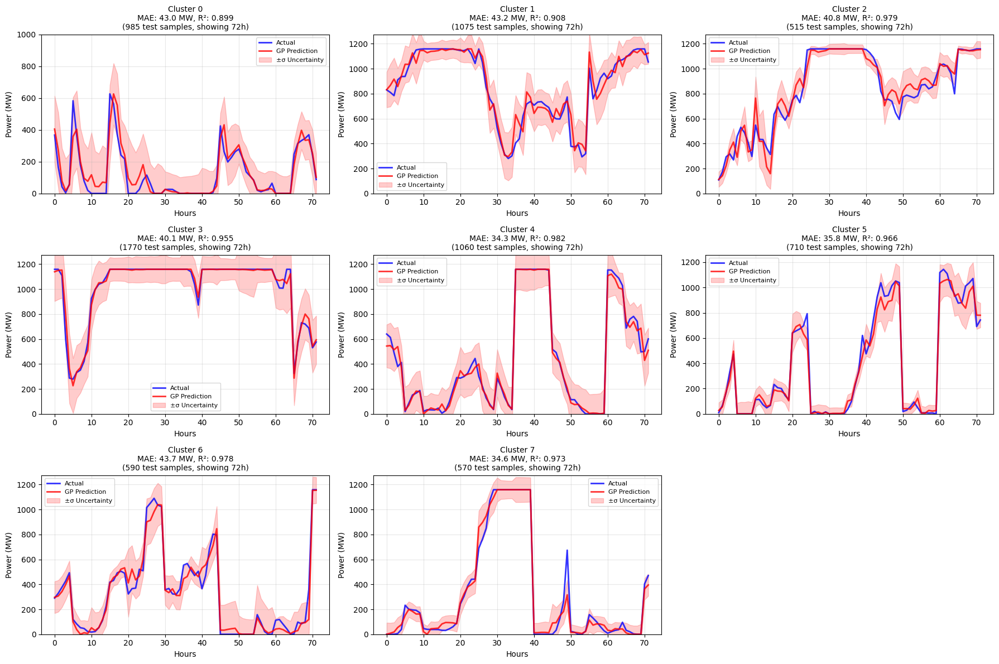


Prediction Plot Summary:
Cluster 0: MAE=43.0 MW, R²=0.899 (985 test points)
Cluster 1: MAE=43.2 MW, R²=0.908 (1075 test points)
Cluster 2: MAE=40.8 MW, R²=0.979 (515 test points)
Cluster 3: MAE=40.1 MW, R²=0.955 (1770 test points)
Cluster 4: MAE=34.3 MW, R²=0.982 (1060 test points)
Cluster 5: MAE=35.8 MW, R²=0.966 (710 test points)
Cluster 6: MAE=43.7 MW, R²=0.978 (590 test points)
Cluster 7: MAE=34.6 MW, R²=0.973 (570 test points)

SUMMARY ACROSS ALL DATA FRACTIONS
 10%: MAE=60.24±9.17 MW, R²=0.910±0.057
 20%: MAE=47.78±9.05 MW, R²=0.937±0.044
 30%: MAE=43.73±2.93 MW, R²=0.948±0.031
 40%: MAE=40.38±3.64 MW, R²=0.953±0.033
 50%: MAE=39.44±3.72 MW, R²=0.955±0.031


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Moray Firth
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=r'/mnt/d/Dominic/Personal/UCL/Research Project/Models/GPs/Final_GPs',
        plot_predictions_flag=True,
        random_state=84
    )
    results_by_fraction[frac] = results['overall_metrics']


print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 291 train periods and 2626 test periods
  Train: 291 periods, Test: 2626 periods

Step 3: Normalising data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL training data statistics...
  Applying log transform to fsr
  Skipping normalisation for hour_sin (cyclical feature)
  Skipping normalis

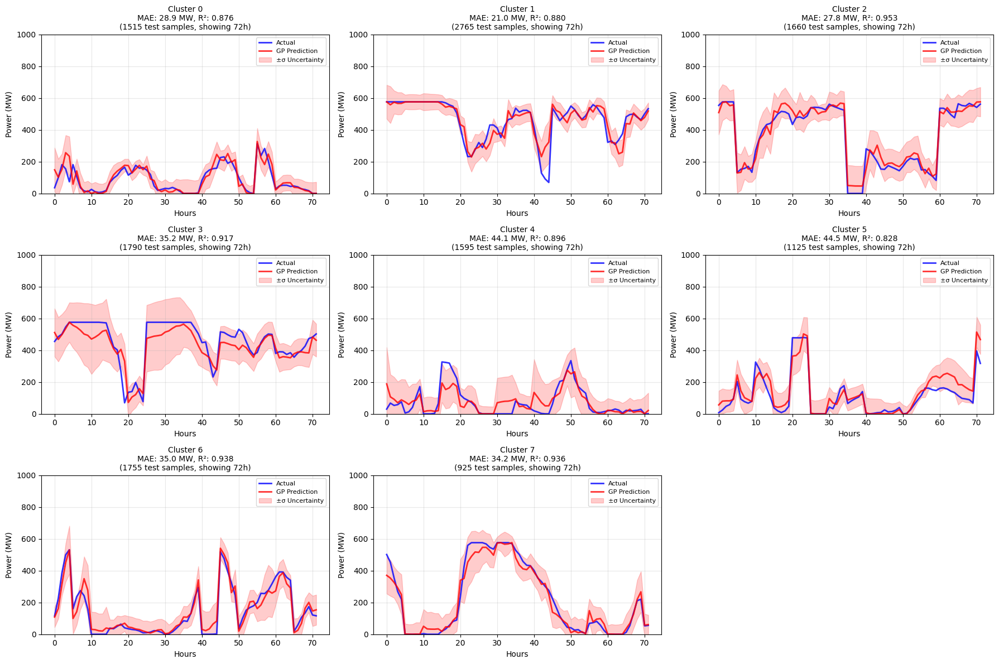


Prediction Plot Summary:
Cluster 0: MAE=28.9 MW, R²=0.876 (1515 test points)
Cluster 1: MAE=21.0 MW, R²=0.880 (2765 test points)
Cluster 2: MAE=27.8 MW, R²=0.953 (1660 test points)
Cluster 3: MAE=35.2 MW, R²=0.917 (1790 test points)
Cluster 4: MAE=44.1 MW, R²=0.896 (1595 test points)
Cluster 5: MAE=44.5 MW, R²=0.828 (1125 test points)
Cluster 6: MAE=35.0 MW, R²=0.938 (1755 test points)
Cluster 7: MAE=34.2 MW, R²=0.936 (925 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 20.0% for training, 80.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 583 train periods and 2334 test periods
  Train: 583 periods, Test: 2334 periods

Step 3: Normalising data

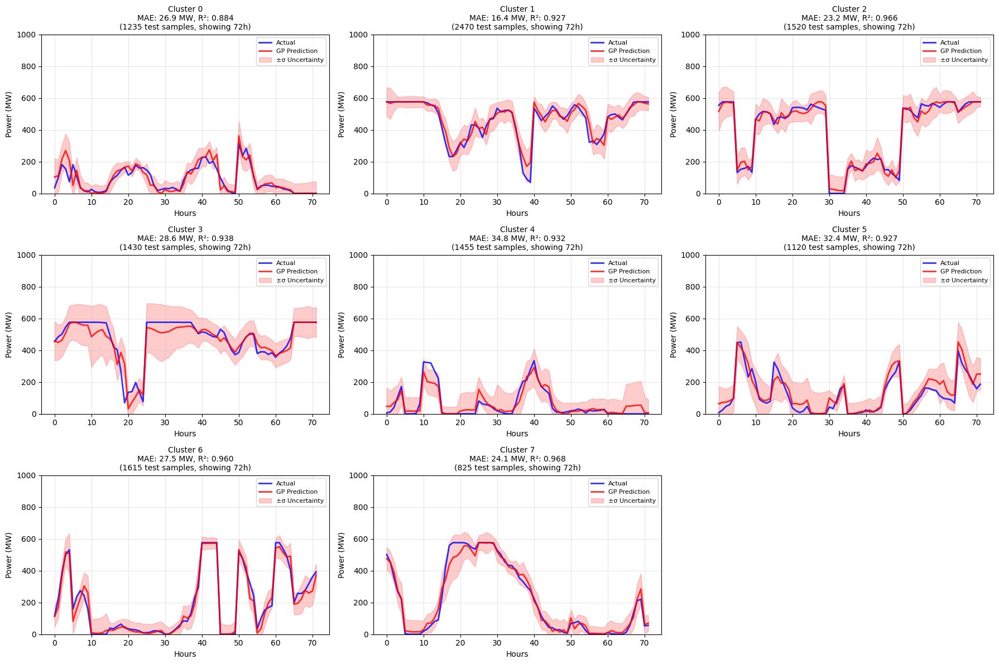


Prediction Plot Summary:
Cluster 0: MAE=26.9 MW, R²=0.884 (1235 test points)
Cluster 1: MAE=16.4 MW, R²=0.927 (2470 test points)
Cluster 2: MAE=23.2 MW, R²=0.966 (1520 test points)
Cluster 3: MAE=28.6 MW, R²=0.938 (1430 test points)
Cluster 4: MAE=34.8 MW, R²=0.932 (1455 test points)
Cluster 5: MAE=32.4 MW, R²=0.927 (1120 test points)
Cluster 6: MAE=27.5 MW, R²=0.960 (1615 test points)
Cluster 7: MAE=24.1 MW, R²=0.968 (825 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 30.0% for training, 70.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 875 train periods and 2042 test periods
  Train: 875 periods, Test: 2042 periods

Step 3: Normalising data

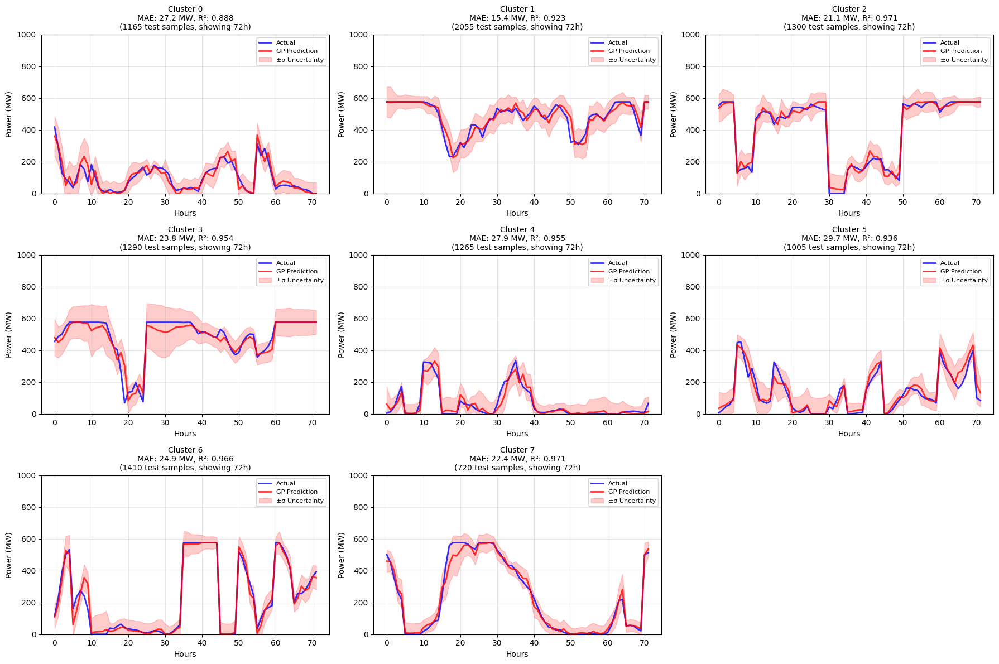


Prediction Plot Summary:
Cluster 0: MAE=27.2 MW, R²=0.888 (1165 test points)
Cluster 1: MAE=15.4 MW, R²=0.923 (2055 test points)
Cluster 2: MAE=21.1 MW, R²=0.971 (1300 test points)
Cluster 3: MAE=23.8 MW, R²=0.954 (1290 test points)
Cluster 4: MAE=27.9 MW, R²=0.955 (1265 test points)
Cluster 5: MAE=29.7 MW, R²=0.936 (1005 test points)
Cluster 6: MAE=24.9 MW, R²=0.966 (1410 test points)
Cluster 7: MAE=22.4 MW, R²=0.971 (720 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 40.0% for training, 60.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 1166 train periods and 1751 test periods
  Train: 1166 periods, Test: 1751 periods

Step 3: Normalising da

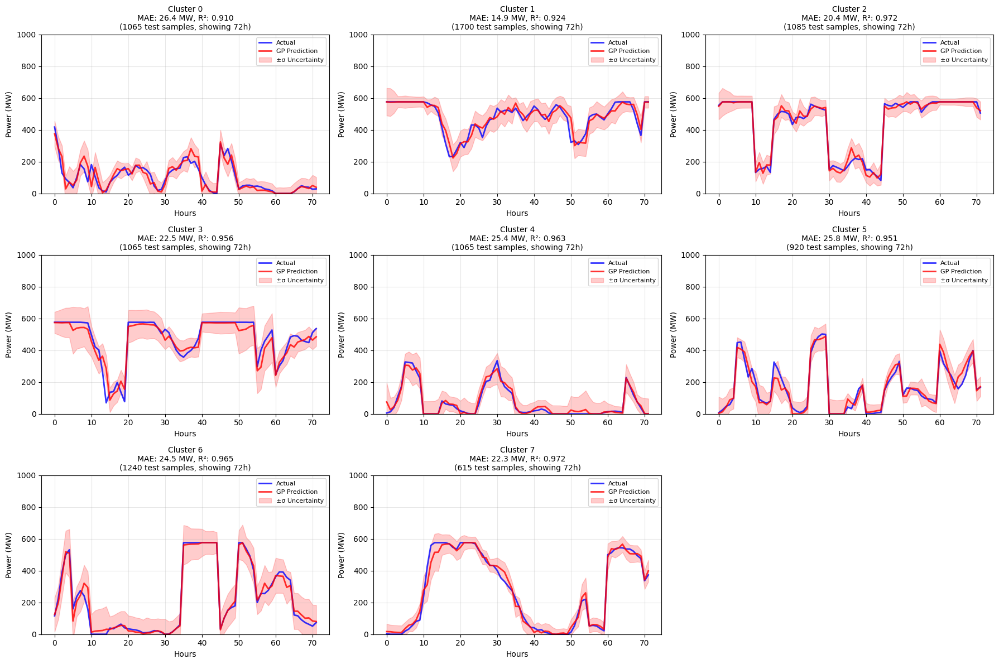


Prediction Plot Summary:
Cluster 0: MAE=26.4 MW, R²=0.910 (1065 test points)
Cluster 1: MAE=14.9 MW, R²=0.924 (1700 test points)
Cluster 2: MAE=20.4 MW, R²=0.972 (1085 test points)
Cluster 3: MAE=22.5 MW, R²=0.956 (1065 test points)
Cluster 4: MAE=25.4 MW, R²=0.963 (1065 test points)
Cluster 5: MAE=25.8 MW, R²=0.951 (920 test points)
Cluster 6: MAE=24.5 MW, R²=0.965 (1240 test points)
Cluster 7: MAE=22.3 MW, R²=0.972 (615 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
Target data: 50.0% for training, 50.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2917 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2917, 17, 6)
  VAE matrix shape: (2917, 6, 6)
  Extracted 2917 time periods

Step 2: Splitting data...
Timeseries randomly split into 1458 train periods and 1459 test periods
  Train: 1458 periods, Test: 1459 periods

Step 3: Normalising dat

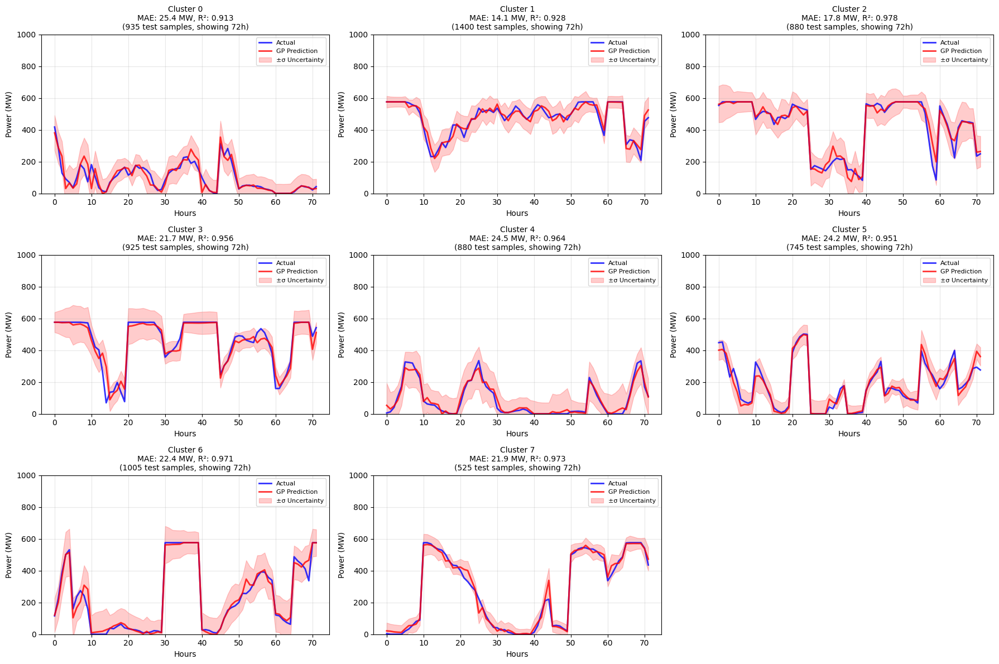


Prediction Plot Summary:
Cluster 0: MAE=25.4 MW, R²=0.913 (935 test points)
Cluster 1: MAE=14.1 MW, R²=0.928 (1400 test points)
Cluster 2: MAE=17.8 MW, R²=0.978 (880 test points)
Cluster 3: MAE=21.7 MW, R²=0.956 (925 test points)
Cluster 4: MAE=24.5 MW, R²=0.964 (880 test points)
Cluster 5: MAE=24.2 MW, R²=0.951 (745 test points)
Cluster 6: MAE=22.4 MW, R²=0.971 (1005 test points)
Cluster 7: MAE=21.9 MW, R²=0.973 (525 test points)

SUMMARY ACROSS ALL DATA FRACTIONS
 10%: MAE=33.84±7.47 MW, R²=0.903±0.039
 20%: MAE=26.74±5.32 MW, R²=0.938±0.026
 30%: MAE=24.05±4.24 MW, R²=0.946±0.027
 40%: MAE=22.77±3.52 MW, R²=0.952±0.021
 50%: MAE=21.52±3.54 MW, R²=0.954±0.021


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Kriegers
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=r'/mnt/d/Dominic/Personal/UCL/Research Project/Models/GPs/Final_GPs',
        plot_predictions_flag=True,
        random_state=84
    )
    results_by_fraction[frac] = results['overall_metrics']


print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")

In [ ]:
fractions = [0.3, 0.4, 0.5]           #East Anglia One
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp_1(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=r'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Models\GP Models\Final_GPs',
        plot_predictions_flag=True,
        random_state=63
    )
    results_by_fraction[frac] = results['overall_metrics'],



print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")

: 

In [13]:
def train_gp_from_scratch_baseline(target_df, source_results, data_fraction=0.1, 
                                   training_iterations=100, plot_predictions_flag=False, random_state=42):
    
    print("=" * 80)
    print("BASELINE: TRAINING GPs FROM SCRATCH (NO TRANSFER LEARNING)")
    print("=" * 80)

    # Extract source configuration (VAE and clustering only)
    optimal_config = source_results['optimal_config']
    n_clusters = optimal_config['k_clusters']
    time_period_hours = optimal_config['time_period_hours']
    source_vae = optimal_config['vae']
    source_train_latent = optimal_config['train_latent']
    source_train_labels = optimal_config['train_cluster_labels']
    source_vae.eval()

    print(f"Configuration: {time_period_hours}h periods, {n_clusters} clusters")
    print(f"Target data: {data_fraction*100:.1f}% for training, {(1-data_fraction)*100:.1f}% for testing")
    print(f"⚠ Training GPs from SCRATCH (no source hyperparameters transferred)")

    # Step 1: Extract timeseries from target data
    print("\nStep 1: Extracting timeseries...")
    timeseries_matrix_full_t, timeseries_matrix_vae_t, period_info_t = extract_timeseries(target_df, time_period_hours)
    print(f"  Extracted {len(timeseries_matrix_full_t)} time periods")

    # Step 2: Split into train/test (SAME AS TRANSFER LEARNING)
    print("\nStep 2: Splitting data...")
    test_ratio = 1.0 - data_fraction
    split_data_vae = split_timeperiods(timeseries_matrix_vae_t, period_info_t, test_ratio=test_ratio, random_state=random_state)
    train_indices = split_data_vae['train_indices']
    test_indices = split_data_vae['test_indices']
    
    train_period_info = split_data_vae['train_period_info']
    test_period_info = split_data_vae['test_period_info']
    
    train_timeseries_full_t = timeseries_matrix_full_t[train_indices]
    test_timeseries_full_t = timeseries_matrix_full_t[test_indices]
    train_timeseries_vae_t = split_data_vae['train_timeseries']
    test_timeseries_vae_t = split_data_vae['test_timeseries']
    
    print(f"  Train: {len(train_timeseries_vae_t)} periods, Test: {len(test_timeseries_vae_t)} periods")

    # Step 3: Normalise data
    print("\nStep 3: Normalising data...")
    train_normalised_vae_t, test_normalised_vae_t, _ = normalise_timeseries(train_timeseries_vae_t, test_timeseries_vae_t)
    train_normalised_full_t, test_normalised_full_t, target_scalers_full, _ = normalise_full_timeseries(train_timeseries_full_t, test_timeseries_full_t)

    # Step 4: Extract VAE features using source VAE (SAME AS TRANSFER LEARNING)
    print("\nStep 4: Extracting VAE features using SOURCE VAE...")
    train_latent_matrix_t = extract_vae_features(source_vae, train_normalised_vae_t, device='cpu')
    test_latent_matrix_t = extract_vae_features(source_vae, test_normalised_vae_t, device='cpu')
    print(f"  Latent dimensions: {train_latent_matrix_t.shape[1]}")

    # Step 5: Assign target periods to source clusters (SAME AS TRANSFER LEARNING)
    print("\nStep 5: Assigning to SOURCE clusters...")
    train_cluster_labels_t = assign_test_clusters(source_train_latent, train_latent_matrix_t, source_train_labels)
    test_cluster_labels_t = assign_test_clusters(source_train_latent, test_latent_matrix_t, source_train_labels)
    
    train_clusters = sorted(np.unique(train_cluster_labels_t))
    test_clusters = sorted(np.unique(test_cluster_labels_t))
    all_source_clusters = sorted(np.unique(source_train_labels))
    
    print(f"  Train clusters present: {train_clusters}")
    print(f"  Test clusters present: {test_clusters}")

    # Step 6: Create forecasting datasets
    print("\nStep 6: Creating forecasting datasets...")
    train_cluster_dataset = create_cluster_forecasting_datasets(
        latent_features=train_latent_matrix_t,
        normalised_timeseries_data=train_normalised_full_t,
        cluster_labels=train_cluster_labels_t,
        period_indices=np.arange(len(train_latent_matrix_t)),
        period_info=train_period_info,
        forecast_horizon=1
    )
    
    test_cluster_dataset = create_cluster_forecasting_datasets(
        latent_features=test_latent_matrix_t,
        normalised_timeseries_data=test_normalised_full_t,
        cluster_labels=test_cluster_labels_t,
        period_indices=np.arange(len(test_latent_matrix_t)),
        period_info=test_period_info,
        forecast_horizon=1
    )

    # Step 7: Train NEW GP models from scratch (NO TRANSFER)
    print("\nStep 7: Training NEW GP models from SCRATCH...")
    print("⚠ No source hyperparameters used - random initialization only")
    
    cluster_models = {}
    device = 'cpu'

    for cluster_id in all_source_clusters:
        print(f"\nCluster {cluster_id}...")
        
        if cluster_id not in train_cluster_dataset or cluster_id not in test_cluster_dataset:
            print(f"  Skipped: No data in this cluster")
            continue

        try:
            # Get target data
            train_data = train_cluster_dataset[cluster_id]
            test_data = test_cluster_dataset[cluster_id]
            X_train, y_train = train_data['X'], train_data['y']
            X_test, y_test = test_data['X'], test_data['y']

            if len(X_train) < 10 or len(X_test) < 10:
                print(f"  Skipped: Insufficient samples (train={len(X_train)}, test={len(X_test)})")
                continue

            print(f"  Training samples: {len(X_train)}, Test samples: {len(X_test)}")

            # Convert to tensors
            train_x = torch.FloatTensor(X_train).to(device)
            train_y = torch.FloatTensor(y_train).to(device)
            test_x = torch.FloatTensor(X_test).to(device)
            
            # Initialize NEW GP from scratch (NO SOURCE TRANSFER)
            target_likelihood = GaussianLikelihood().to(device)
            target_model = GPModel(train_x, train_y, target_likelihood).to(device)
            
            # Train from scratch
            target_model.train()
            target_likelihood.train()
            
            optimizer = torch.optim.Adam(target_model.parameters(), lr=0.1)
            mll = ExactMarginalLogLikelihood(target_likelihood, target_model)
            
            print(f"  Training from scratch ({training_iterations} iterations)...", end="")
            
            for i in range(training_iterations):
                optimizer.zero_grad()
                output = target_model(train_x)
                loss = -mll(output, train_y)
                
                if torch.isnan(loss) or torch.isinf(loss):
                    print(f" ⚠ Invalid loss at iteration {i}, stopping")
                    break
                
                loss.backward()
                optimizer.step()
                
                # Progress indicator
                if (i + 1) % 25 == 0:
                    print(".", end="", flush=True)
            
            print(" Done")
            
            # Evaluate on test set
            target_model.eval()
            target_likelihood.eval()
            
            with torch.no_grad(), gpytorch.settings.fast_pred_var():
                predictions = target_likelihood(target_model(test_x))
                y_pred = predictions.mean.cpu().numpy()
                y_std = predictions.stddev.cpu().numpy()
            
            # Scale predictions and uncertainties to MW
            if 'Power' in target_scalers_full:
                power_scaler = target_scalers_full['Power']
                power_range = power_scaler.data_max_[0] - power_scaler.data_min_[0]
                
                y_test_mw = power_scaler.inverse_transform(y_test.reshape(-1, 1)).ravel()
                y_pred_mw = np.clip(power_scaler.inverse_transform(y_pred.reshape(-1, 1)).ravel(), 0, 1040)
                y_std_mw = y_std * power_range
                
                mae = mean_absolute_error(y_test_mw, y_pred_mw)
                r2 = r2_score(y_test_mw, y_pred_mw)
                rmse = np.sqrt(mean_squared_error(y_test_mw, y_pred_mw))

                print(f"  MAE: {mae:.1f} MW, R²: {r2:.3f}, RMSE: {rmse:.1f} MW")

                cluster_models[cluster_id] = {
                    'gp': target_model,
                    'likelihood': target_likelihood,
                    'metrics': {'mae': mae, 'r2': r2, 'rmse': rmse, 'n_train': len(y_train), 'n_test': len(y_test)},
                    'predictions_mw': y_pred_mw,
                    'actuals_mw': y_test_mw,
                    'uncertainties_mw': y_std_mw,
                    'predictions_norm': y_pred,
                    'actuals_norm': y_test,
                    'uncertainties_norm': y_std
                }
            else:
                mae = mean_absolute_error(y_test, y_pred)
                r2 = r2_score(y_test, y_pred)
                rmse = np.sqrt(mean_squared_error(y_test, y_pred))
                
                print(f"  MAE: {mae:.4f} (normalized), R²: {r2:.3f}")
                
                cluster_models[cluster_id] = {
                    'gp': target_model,
                    'likelihood': target_likelihood,
                    'metrics': {'mae': mae, 'r2': r2, 'rmse': rmse, 'n_train': len(y_train), 'n_test': len(y_test)},
                    'predictions_norm': y_pred,
                    'actuals_norm': y_test,
                    'uncertainties_norm': y_std
                }

        except Exception as e:
            print(f"  ✗ Error: {e}")
            import traceback
            traceback.print_exc()
            continue

    if not cluster_models:
        raise RuntimeError("No GP models were successfully trained from scratch")

    # Step 8: Calculate overall metrics
    print("\n" + "="*80)
    print("BASELINE RESULTS SUMMARY (TRAINED FROM SCRATCH)")
    print("="*80)
    
    all_maes = np.array([m['metrics']['mae'] for m in cluster_models.values()])
    all_r2s = np.array([m['metrics']['r2'] for m in cluster_models.values()])
    all_rmses = np.array([m['metrics']['rmse'] for m in cluster_models.values()])

    overall_metrics = {
        'mae_mean': np.mean(all_maes),
        'mae_std': np.std(all_maes),
        'r2_mean': np.mean(all_r2s),
        'r2_std': np.std(all_r2s),
        'rmse_mean': np.mean(all_rmses),
        'rmse_std': np.std(all_rmses),
        'clusters_processed': len(cluster_models),
        'total_clusters': len(all_source_clusters),
        'data_fraction': data_fraction,
        'method': 'from_scratch'
    }

    print(f"Method: Training from SCRATCH (no transfer learning)")
    print(f"Data used: {data_fraction*100:.1f}% of target data")
    print(f"Clusters: {overall_metrics['clusters_processed']}/{overall_metrics['total_clusters']} processed")
    print(f"MAE:  {overall_metrics['mae_mean']:.2f} ± {overall_metrics['mae_std']:.2f} MW")
    print(f"R²:   {overall_metrics['r2_mean']:.3f} ± {overall_metrics['r2_std']:.3f}")
    print(f"RMSE: {overall_metrics['rmse_mean']:.2f} ± {overall_metrics['rmse_std']:.2f} MW")

    # Generate plots if requested
    if plot_predictions_flag:
        print("\nGenerating prediction plots...")
        
        plotting_config = {
            'time_period_hours': time_period_hours,
            'k_clusters': n_clusters,
            'scalers': target_scalers_full,
        }

        final_results = {'cluster_gp_models': {}}
        for cluster_id, model_info in cluster_models.items():
            model_metrics = model_info['metrics'].copy()
            if 'predictions_mw' in model_info:
                model_metrics.update({
                    'actual_original': model_info['actuals_mw'],
                    'predictions_original': model_info['predictions_mw'],
                    'uncertainties_original': model_info['uncertainties_mw']
                })
            else:
                model_metrics.update({
                    'actual_normalized': model_info['actuals_norm'],
                    'predictions_normalized': model_info['predictions_norm'],
                    'uncertainties_normalized': model_info['uncertainties_norm']
                })
            final_results['cluster_gp_models'][cluster_id] = {'metrics': model_metrics}

        plot_cluster_predictions(final_results, plotting_config, plot_hours=72)

    return {
        'cluster_models': cluster_models,
        'overall_metrics': overall_metrics,
        'data_fraction': data_fraction,
        'n_clusters_processed': len(cluster_models),
        'method': 'from_scratch'
    }

In [12]:
fractions = [0.1, 0.20, 0.30, 0.40, 0.50]

transfer_results = {}
baseline_results = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")
    
    # 2. Baseline (training from scratch)
    print("\n--- BASELINE (Training GPs from Scratch) ---")
    baseline_results[frac] = train_gp_from_scratch_baseline(
        target_df,
        source_results,
        data_fraction=frac,
        training_iterations=100,
        plot_predictions_flag=False, random_state=42
    )


EXPERIMENT: 10% TARGET DATA


--- BASELINE (Training GPs from Scratch) ---
BASELINE: TRAINING GPs FROM SCRATCH (NO TRANSFER LEARNING)
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing
⚠ Training GPs from SCRATCH (no source hyperparameters transferred)

Step 1: Extracting timeseries...
  Extracted: 2918 6-hour continuous periods
  Skipped 1 periods due to temporal discontinuities
  Full matrix shape: (2918, 17, 6)
  VAE matrix shape: (2918, 6, 6)
  Extracted 2918 time periods

Step 2: Splitting data...
Timeseries randomly split into 291 train periods and 2627 test periods
  Train: 291 periods, Test: 2627 periods

Step 3: Normalising data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL training da

KeyboardInterrupt: 

In [17]:
fractions = [0.3, 0.4]

transfer_results = {}
baseline_results = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")
    
    # 1. VAE Fine-tuned Transfer Learning
    print("--- VAE FINE-TUNED TRANSFER LEARNING ---")
    transfer_results[frac] = transfer_learning_gp(
        target_df=target_df,
        source_results=source_results,
        data_fraction=frac,
        gp_dir=r'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Models\GP Models\Final_GPs',
        vae_epochs=50,
        vae_lr=1e-4,
        gp_iterations=50,
        gp_lr=0.05,
        plot_predictions_flag=False,
        random_state=84
    )
    
    # 2. Baseline (training from scratch)
    print("\n--- BASELINE (Training GPs from Scratch) ---")
    baseline_results[frac] = train_gp_from_scratch_baseline(
        target_df=target_df,
        source_results=source_results,
        data_fraction=frac,
        training_iterations=100,
        plot_predictions_flag=False,
        random_state=84
    )

# ============================================================================
# COMPARISON RESULTS
# ============================================================================

print("\n" + "="*80)
print("VAE FINE-TUNED TRANSFER LEARNING vs BASELINE COMPARISON")
print("="*80 + "\n")

# Main performance comparison
comparison_df = pd.DataFrame({
    'Data %': [f"{frac*100:.0f}%" for frac in fractions],
    'Transfer MAE': [transfer_results[frac]['overall_metrics']['mae_mean'] for frac in fractions],
    'Baseline MAE': [baseline_results[frac]['overall_metrics']['mae_mean'] for frac in fractions],
    'MAE Improvement': [
        ((baseline_results[frac]['overall_metrics']['mae_mean'] - 
          transfer_results[frac]['overall_metrics']['mae_mean']) / 
         baseline_results[frac]['overall_metrics']['mae_mean'] * 100)
        for frac in fractions
    ],
    'Transfer R²': [transfer_results[frac]['overall_metrics']['r2_mean'] for frac in fractions],
    'Baseline R²': [baseline_results[frac]['overall_metrics']['r2_mean'] for frac in fractions],
    'R² Improvement': [
        (transfer_results[frac]['overall_metrics']['r2_mean'] - 
         baseline_results[frac]['overall_metrics']['r2_mean'])
        for frac in fractions
    ]
})

print(comparison_df.to_string(index=False))

# VAE adaptation metrics
print("\n" + "="*80)
print("VAE ADAPTATION METRICS")
print("="*80 + "\n")

vae_metrics_df = pd.DataFrame({
    'Data %': [f"{frac*100:.0f}%" for frac in fractions],
    'VAE Loss Improvement': [transfer_results[frac]['vae_improvement'] for frac in fractions],
    'Initial Distribution Shift': [
        transfer_results[frac]['overall_metrics']['distribution_shift']['initial_shift'] 
        for frac in fractions
    ],
    'Final Mean Shift': [
        transfer_results[frac]['overall_metrics']['distribution_shift']['final_mean_shift'] 
        for frac in fractions
    ],
    'Final Std Shift': [
        transfer_results[frac]['overall_metrics']['distribution_shift']['final_std_shift'] 
        for frac in fractions
    ]
})

print(vae_metrics_df.to_string(index=False))

# Per-cluster detailed comparison
print("\n" + "="*80)
print("PER-CLUSTER PERFORMANCE COMPARISON")
print("="*80 + "\n")

for frac in fractions:
    print(f"\n{frac*100:.0f}% Data - Cluster-by-Cluster Results:")
    print("-" * 60)
    
    transfer_models = transfer_results[frac]['cluster_models']
    baseline_models = baseline_results[frac]['cluster_models']
    
    # Get all clusters present in both
    common_clusters = sorted(set(transfer_models.keys()) & set(baseline_models.keys()))
    
    cluster_comparison = []
    for cluster_id in common_clusters:
        transfer_mae = transfer_models[cluster_id]['metrics']['mae']
        baseline_mae = baseline_models[cluster_id]['metrics']['mae']
        improvement = ((baseline_mae - transfer_mae) / baseline_mae * 100)
        
        cluster_comparison.append({
            'Cluster': cluster_id,
            'Transfer MAE': f"{transfer_mae:.1f}",
            'Baseline MAE': f"{baseline_mae:.1f}",
            'Improvement': f"{improvement:+.1f}%",
            'Transfer R²': f"{transfer_models[cluster_id]['metrics']['r2']:.3f}",
            'Baseline R²': f"{baseline_models[cluster_id]['metrics']['r2']:.3f}",
            'n_train': transfer_models[cluster_id]['metrics']['n_train']
        })
    
    cluster_df = pd.DataFrame(cluster_comparison)
    print(cluster_df.to_string(index=False))
    
    # Summary statistics
    improvements = [
        ((baseline_models[c]['metrics']['mae'] - transfer_models[c]['metrics']['mae']) / 
         baseline_models[c]['metrics']['mae'] * 100)
        for c in common_clusters
    ]
    
    print(f"\nSummary for {frac*100:.0f}% data:")
    print(f"  Clusters with improvement: {sum(1 for i in improvements if i > 0)}/{len(improvements)}")
    print(f"  Clusters with degradation: {sum(1 for i in improvements if i < 0)}/{len(improvements)}")
    print(f"  Average improvement: {np.mean(improvements):.2f}%")
    print(f"  Median improvement: {np.median(improvements):.2f}%")
    print(f"  Best improvement: {np.max(improvements):.2f}%")
    print(f"  Worst degradation: {np.min(improvements):.2f}%")

# Statistical significance test (if desired)
print("\n" + "="*80)
print("STATISTICAL ANALYSIS")
print("="*80 + "\n")

for frac in fractions:
    transfer_models = transfer_results[frac]['cluster_models']
    baseline_models = baseline_results[frac]['cluster_models']
    common_clusters = sorted(set(transfer_models.keys()) & set(baseline_models.keys()))
    
    transfer_maes = [transfer_models[c]['metrics']['mae'] for c in common_clusters]
    baseline_maes = [baseline_models[c]['metrics']['mae'] for c in common_clusters]
    
    # Paired t-test
    from scipy import stats
    t_stat, p_value = stats.ttest_rel(baseline_maes, transfer_maes)
    
    print(f"{frac*100:.0f}% Data:")
    print(f"  Paired t-test: t={t_stat:.3f}, p={p_value:.4f}")
    if p_value < 0.05:
        if np.mean(baseline_maes) > np.mean(transfer_maes):
            print(f"  ✓ Transfer learning is SIGNIFICANTLY better (p < 0.05)")
        else:
            print(f"  ✗ Baseline is SIGNIFICANTLY better (p < 0.05)")
    else:
        print(f"  No significant difference (p >= 0.05)")
    print()


EXPERIMENT: 30% TARGET DATA

--- VAE FINE-TUNED TRANSFER LEARNING ---
VAE FINE-TUNED TRANSFER LEARNING FOR WIND POWER FORECASTING
Configuration: 6h periods, 8 clusters
VAE fine-tuning: 50 epochs @ lr=0.0001
GP fine-tuning: 50 iterations @ lr=0.05
Target data: 30.0% for training, 70.0% for testing

Step 1: Extracting timeseries...
  Extracted: 2916 6-hour continuous periods
  Skipped 2 periods due to temporal discontinuities
  Full matrix shape: (2916, 17, 6)
  VAE matrix shape: (2916, 6, 6)
  Extracted 2916 time periods

Step 2: Splitting data...
Timeseries randomly split into 874 train periods and 2042 test periods
  Train: 874 periods, Test: 2042 periods

Step 3: Normalizing data...
Normalising VAE timeseries using VAE training data statistics...
  Applying log transform to fsr
  Skipping normalisation for wind_dir_sin (cyclical feature)
  Skipping normalisation for wind_dir_cos (cyclical feature)
  Normalised 6 channels using MinMaxScaler
Normalising FULL timeseries using FULL trai